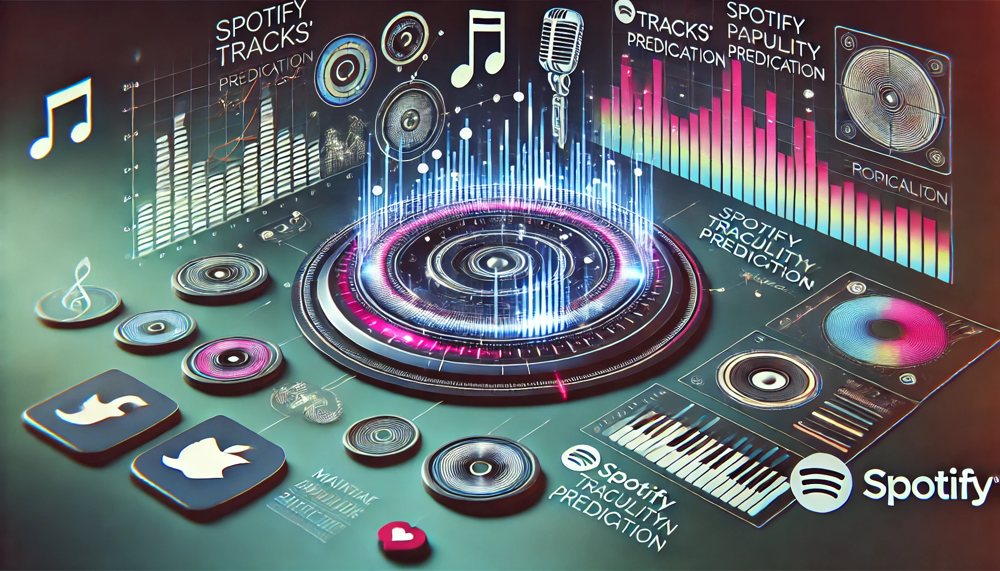

# Problem Statement

The goal of this project is to predict the popularity of Spotify tracks based on their audio features and metadata. Popularity is a crucial metric for artists, record labels, and streaming services to gauge the potential success of a track. By predicting the popularity of tracks before or shortly after release, we can assist in decision-making processes, such as marketing efforts, playlist curation, and talent acquisition.

The main question we aim to address is: "***Can we predict the popularity of a Spotify track using its metadata and audio characteristics?***"

# Business Objectives

1. **Increase Track Success Prediction Accuracy**:
   - **Goal**: Accurately predict the future popularity of tracks to maximize promotional effectiveness.
   - **Outcome**: Record labels and streaming platforms can focus resources on tracks that are predicted to perform well, improving the likelihood of commercial success and reducing investment risk.

2. **Optimize Marketing Spend**:
   - **Goal**: Help record labels and artists allocate marketing budgets more efficiently by predicting which tracks will gain traction and require additional promotion.
   - **Outcome**: Significant cost savings in promotional campaigns, as funds can be targeted towards tracks with higher predicted popularity, maximizing return on investment (ROI).

3. **Enhance Playlist Curation and User Experience**:
   - **Goal**: Support streaming platforms like Spotify in curating popular and engaging playlists by integrating popularity predictions into their recommendation engines.
   - **Outcome**: Improved user satisfaction and retention as users are more likely to engage with playlists that feature tracks predicted to be popular, increasing both streaming time and subscription renewals.

4. **Talent Identification and A&R Decision Support**:
   - **Goal**: Assist Artist & Repertoire (A&R) teams at record labels in identifying new talent by predicting which tracks or artists are likely to become popular.
   - **Outcome**: More effective talent scouting and contract negotiations, leading to early investment in artists with high potential, securing the label's market position.

5. **Increase Revenue Through Targeted Campaigns**:
   - **Goal**: Allow artists, labels, and platforms to launch more targeted promotional campaigns based on track popularity predictions.
   - **Outcome**: Increased streaming numbers and sales of high-potential tracks, boosting overall revenue from streaming, downloads, merchandise, and concert sales.

6. **Improve Artist Strategy and Track Development**:
   - **Goal**: Help artists and their teams make data-driven decisions about track development by understanding which audio features (e.g., danceability, energy, tempo) contribute most to a song's popularity.
   - **Outcome**: Artists can create music that is more likely to resonate with listeners, increasing their chances of producing a hit track, which can further their career and boost their earnings.

7. **Maximize Platform Engagement and Ad Revenue**:
   - **Goal**: Help streaming platforms optimize content delivery by integrating popularity predictions to keep users engaged with popular content.
   - **Outcome**: Longer streaming sessions and increased engagement, resulting in higher ad impressions and increased ad revenue for the platform.

By aligning the predictive model's capabilities with these business objectives, this project aims to deliver substantial value across the music industry. Record labels, streaming platforms, and artists can make better-informed decisions that drive both creative and commercial success. The ability to predict track popularity will empower stakeholders to optimize their operations, enhance user experiences, and ultimately increase profitability.

# Business Impacts

Predicting the popularity of Spotify tracks has multiple impacts across different stakeholders in the music industry:

1. **For Record Labels**:
   - **Talent Scouting and Investment**: Record labels can use the model to identify promising new artists or tracks and allocate marketing budgets more efficiently.
   - **Release Strategy**: The model can help determine the best time to release a track based on its predicted popularity, optimizing for exposure and success.

2. **For Artists**:
   - **Track Optimization**: Artists can better understand which aspects of their music (e.g., danceability, energy, acousticness) are more likely to result in a hit song, allowing them to make informed creative decisions.
   - **Branding and Marketing**: Artists can target their promotional efforts based on predicted popularity, focusing on social media and playlist placements for tracks with higher potential.

3. **For Streaming Platforms**:
   - **Playlist Curation**: Streaming platforms like Spotify can enhance their automated playlist curation processes by integrating popularity predictions to prioritize high-potential tracks.
   - **User Retention and Engagement**: By surfacing more popular tracks, platforms can keep users engaged, potentially leading to higher subscription rates and ad revenue.

# Procedure

1. **Data Preprocessing**:
 - Clean the dataset by handling missing values and removing duplicates.
 - Perform feature scaling and encode categorical features appropriately.
 - Conduct exploratory data analysis (EDA) to understand the relationships between features and the target variable.

2. **Feature Engineering**:
 - Select the most relevant features (audio characteristics and metadata) that influence a track’s popularity.
 - Possibly create new features or bins for the target variable to assist in a classification-based approach.

3. **Model Development**:
 - Train a variety of machine learning models (e.g., Linear Regression, Random Forest, Neural Networks) to predict a track’s popularity.

 - Experiment with both regression and classification approaches depending on how the popularity variable is handled.

 - Evaluate the models using appropriate metrics like Mean Absolute Error (MAE) for regression, or accuracy and F1-score for classification.

4. **Model Tuning**:
 - Optimize the models through hyperparameter tuning and cross-validation to improve performance.
  - Explore different model architectures, especially for neural networks, to ensure they generalize well to new data.

5. **Business Insights and Model Deployment**:
 - Provide business recommendations based on the model’s output (e.g., which track features correlate most with high popularity).
 - Ensure the model is scalable and can be integrated into a streaming platform or a marketing decision-making tool.

# Importing Necessary Laibraries

In [1]:
import pandas as pd
import numpy as np
import math
import random
random.seed(0)

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_score, accuracy_score, confusion_matrix, f1_score, classification_report, pairwise_distances, cohen_kappa_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.neighbors import NearestNeighbors

import scipy.stats as stats
from scipy.stats import kstest, yeojohnson

import matplotlib.pyplot as plt
import seaborn as sns
from yellowbrick.cluster import KElbowVisualizer

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
import re
nltk.download('punkt')
nltk.download('stopwords')

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Imorting the Dataset

In [2]:
!git clone https://github.com/sdey96/Spotify-Popularity-Classification.git

fatal: destination path 'Spotify-Popularity-Classification' already exists and is not an empty directory.


In [3]:
file_path = "/content/Spotify-Popularity-Classification/Spotify Dataset.csv"

df = pd.read_csv(file_path)

df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


## Defining the Features/ Variables

The dataset contains information about Spotify tracks with various features. Here is a detailed explanation of the features:

1. **Unnamed: 0**: An index column (*needs to be dropped*).
2. **track_id**: A unique identifier for each track on Spotify.
3. **artists**: The name(s) of the artist(s) associated with the track.
4. **album_name**: The name of the album on which the track appears.
5. **track_name**: The title of the track.
6. **popularity** [TARGET]: A numerical value indicating the popularity of the track, typically on a scale from 0 to 100.
7. **duration_ms**: The duration of the track in milliseconds.
8. **explicit**: A boolean indicating whether the track has explicit content (`True` for explicit, `False` for clean).
9. **danceability**: A measure of how suitable a track is for dancing, with higher values indicating more danceable tracks.
10. **energy**: A measure of the intensity and activity of the track, with higher values indicating more energetic tracks.
11. **key**: The key in which the track is composed, represented as an integer.
12. **loudness**: The overall loudness of the track in decibels (dB), averaged across the entire track.
13. **mode**: Indicates the modality (major or minor) of the track. Major is represented by 1 and minor by 0.
14. **speechiness**: A measure of the presence of spoken words in the track. Higher values indicate more speech-like qualities.
15. **acousticness**: A measure of the acoustic nature of the track, with higher values indicating more acoustic sounds.
16. **instrumentalness**: Predicts whether a track contains no vocals. Higher values indicate greater likelihood of the track being instrumental.
17. **liveness**: A measure of the presence of a live audience in the recording. Higher values indicate a higher probability of the track being a live recording.
18. **valence**: A measure of the musical positiveness conveyed by the track, with higher values indicating more positive (happy) tracks.
19. **tempo**: The overall estimated tempo of a track in beats per minute (BPM).
20. **time_signature**: An estimated time signature, indicating the number of beats in each bar.
21. **track_genre**: The genre of the track.

## Basic Checks

In [4]:
df.shape

(114000, 21)

In [151]:
df.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [152]:
df.isnull().sum().sort_values(ascending=False)

,0
artists,1
album_name,1
track_name,1
Unnamed: 0,0
mode,0
time_signature,0
tempo,0
valence,0
liveness,0
instrumentalness,0


In [153]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [154]:
df.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [155]:
duplicates = df[df.duplicated()]

print("Duplicate Rows except first occurrence based on all columns:")
print(duplicates)

Duplicate Rows except first occurrence based on all columns:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


# Data Preprocessing

In [5]:
# Custom transformer for preprocessing steps
class CustomPreprocessor(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Drop 'Unnamed: 0' and 'track_id' columns
        X = X.drop(columns=['Unnamed: 0', 'track_id'])

        # Filter rows where 'speechiness' < 0.8
        X = X[X['speechiness'] < 0.8]

        # Drop rows where 'time_signature' < 3
        X = X.loc[X['time_signature'] >= 3]

        # Drop rows where 'duration_ms' == 0
        X = X[X['duration_ms'] != 0]

        return X

# Creating the pipeline
preprocessing_pipeline = Pipeline([
    ('custom_preprocessor', CustomPreprocessor())
])

# Feature Enginering

In [6]:
# Custom transformer for feature engineering with nltk
class FeatureEngineering(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.stop_words = set(stopwords.words('english'))  # Define stopwords to ignore

    def tokenize_and_clean(self, text):
        # Tokenize the text and remove stopwords
        words = word_tokenize(text.lower())
        words = [word for word in words if word.isalpha() and word not in self.stop_words]
        return words

    def fit(self, X, y=None):
        # Extract the 5 most frequent words from 'track_name'
        track_names = X['track_name'].apply(lambda x: self.tokenize_and_clean(str(x)))
        track_word_count = Counter([word for sublist in track_names for word in sublist])
        self.top_5_track_words = [word for word, _ in track_word_count.most_common(5)]

        # Extract the 5 most frequent words from 'album_name'
        album_names = X['album_name'].apply(lambda x: self.tokenize_and_clean(str(x)))
        album_word_count = Counter([word for sublist in album_names for word in sublist])
        self.top_5_album_words = [word for word, _ in album_word_count.most_common(5)]

        # Extract the 5 most frequent artists from 'artists' (multi-artist separated by ';')
        artist_names = X['artists'].apply(lambda x: str(x).split(';'))
        artist_name_count = Counter([artist.strip().lower() for sublist in artist_names for artist in sublist])
        self.top_5_artists = [artist for artist, _ in artist_name_count.most_common(5)]

        return self

    def transform(self, X, y=None):
        X = X.copy()

        # Add columns for the 5 most frequent words in 'track_name'
        for word in self.top_5_track_words:
            X[f'{word}_track'] = X['track_name'].apply(lambda x: 1 if word in self.tokenize_and_clean(str(x)) else 0).astype(bool)
        X['Others_track'] = X[[f'{word}_track' for word in self.top_5_track_words]].apply(lambda row: 1 if row.sum() == 0 else 0, axis=1).astype(bool)

        # Add columns for the 5 most frequent words in 'album_name'
        for word in self.top_5_album_words:
            X[f'{word}_album'] = X['album_name'].apply(lambda x: 1 if word in self.tokenize_and_clean(str(x)) else 0).astype(bool)
        X['Others_album'] = X[[f'{word}_album' for word in self.top_5_album_words]].apply(lambda row: 1 if row.sum() == 0 else 0, axis=1).astype(bool)

        # Add columns for the 5 most frequent artists in 'artists'
        for artist in self.top_5_artists:
            X[f'{artist}_artist'] = X['artists'].apply(lambda x: 1 if artist in [name.strip().lower() for name in str(x).split(';')] else 0).astype(bool)
        X['Others_artist'] = X[[f'{artist}_artist' for artist in self.top_5_artists]].apply(lambda row: 1 if row.sum() == 0 else 0, axis=1).astype(bool)

        # Drop 'track_name', 'album_name', and 'artists' columns
        X = X.drop(columns=['track_name', 'album_name', 'artists'])

        # Replace values in 'mode' column
        X['mode'] = X['mode'].replace({0: 'minor', 1: 'major'})

        # Replace values in 'key' column
        key_mapping = {
            0: 'C', 1: 'C-sharp_D-flat', 2: 'D', 3: 'D-sharp_E-flat', 4: 'E',
            5: 'F', 6: 'F-sharp_G-flat', 7: 'G', 8: 'G-sharp_A-flat', 9: 'A',
            10: 'A-sharp_B-flat', 11: 'B'
        }
        X['key'] = X['key'].replace(key_mapping)

        # Replace values in 'time_signature' column
        time_signature_mapping = {
            3: '3/4', 4: '4/4', 5: '5/4', 6: '6/4', 7: '7/4'
        }
        X['time_signature'] = X['time_signature'].replace(time_signature_mapping)

        return X

# Create the NLTK-based feature engineering pipeline
feature_engineering_pipeline = Pipeline([
    ('feature_engineering', FeatureEngineering())
])

## Combined Pipeline

In [7]:
# Combine the preprocessing and nltk feature engineering pipelines
combined_pipeline = Pipeline([
    ('preprocessing', preprocessing_pipeline),
    ('feature_engineering', feature_engineering_pipeline)
])

In [8]:
final_data = combined_pipeline.fit_transform(df)

In [9]:
final_data.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,...,vivo_album,ao_album,de_album,Others_album,j balvin_artist,bad bunny_artist,daddy yankee_artist,feid_artist,george jones_artist,Others_artist
0,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,0.0322,...,False,False,False,True,False,False,False,False,False,True
1,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,0.9240,...,False,False,False,True,False,False,False,False,False,True
2,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,0.2100,...,False,False,False,True,False,False,False,False,False,True
3,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,0.9050,...,False,False,False,True,False,False,False,False,False,True
4,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,0.4690,...,False,False,False,True,False,False,False,False,False,True


In [10]:
final_data.shape

(112114, 34)

In [11]:
final_data.isnull().sum()

,0
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0
key,0
loudness,0
mode,0
speechiness,0
acousticness,0


# Treatment with the Outliers

In [12]:
numeric_cols = final_data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = final_data.select_dtypes(include=['object', 'bool']).columns
numeric_cols, categorical_cols

(Index(['popularity', 'duration_ms', 'danceability', 'energy', 'loudness',
        'speechiness', 'acousticness', 'instrumentalness', 'liveness',
        'valence', 'tempo'],
       dtype='object'),
 Index(['explicit', 'key', 'mode', 'time_signature', 'track_genre',
        'vivo_track', 'remix_track', 'ao_track', 'de_track', 'feat_track',
        'Others_track', 'vol_album', 'christmas_album', 'vivo_album',
        'ao_album', 'de_album', 'Others_album', 'j balvin_artist',
        'bad bunny_artist', 'daddy yankee_artist', 'feid_artist',
        'george jones_artist', 'Others_artist'],
       dtype='object'))

## Z-Score Scaling

In [13]:
max_rows = 50
z_scores = (final_data[numeric_cols] - final_data[numeric_cols].mean()) / final_data[numeric_cols].std()

### Z-Score greater than 3

In [14]:
threshold = 3
outliers = (z_scores.abs() > threshold).any(axis=1)

## Boxplot of the Outliers

### Get the style of the outliers and limit the number of rows to display

In [15]:
outliers_style = final_data[outliers].style.background_gradient(cmap='Reds').\
                 set_table_attributes("style='display: table-row-group;'").\
                 set_caption(f"Outliers ({outliers.sum()} rows)")

outliers_html = outliers_style._repr_html_()

### Get the table header and limit the number of rows to display

In [16]:
header = final_data.head(0).style.set_table_attributes("style='display: none;'")._repr_html_()
data = final_data.head(max_rows if len(final_data) > max_rows else len(final_data)).style._repr_html_()

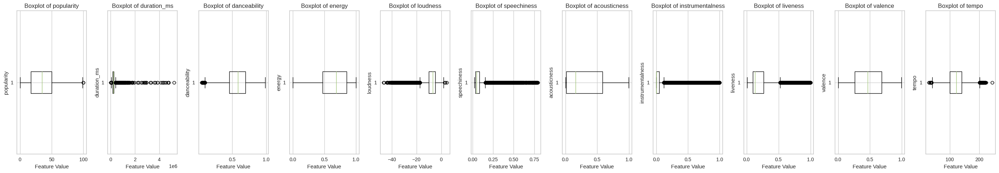

In [17]:
fig, axes = plt.subplots(nrows=1, ncols=len(numeric_cols), figsize=(28, 5))

for i, col in enumerate(numeric_cols):
    axes[i].boxplot(final_data[col], vert=False)

    axes[i].set_title(f"Boxplot of {col}")
    axes[i].set_xlabel("Feature Value")
    axes[i].set_ylabel(col)

fig.tight_layout()

plt.show()

Each boxplot represents the distribution of different features (likely from a dataset related to Spotify songs, given the context) such as `popularity`, `duration_ms`, `danceability`, etc. Here’s a breakdown of what each boxplot tells us about the corresponding feature:

**General Structure of Boxplots**
- **Box (Interquartile Range, IQR):** The box itself represents the interquartile range, which contains the middle 50% of the data.
  - **Lower Quartile (Q1, bottom of the box):** The 25th percentile of the data.
  - **Upper Quartile (Q3, top of the box):** The 75th percentile of the data.
  - **Median (Green Line):** The line inside the box represents the median (50th percentile).
- **Whiskers:** The lines extending from the box represent the range of the data within 1.5 times the IQR from the quartiles.
- **Outliers (circles):** Points beyond the whiskers are considered outliers and are plotted as individual points.

**Explanation of Each Boxplot**

1. **Popularity:**
   - **Range:** Most of the values are centered around the 50th percentile, with the data slightly skewed towards higher values (near the upper quartile).
   - **Outliers:** There are a few outliers on the higher end of the popularity scale, indicating some exceptionally popular songs.

2. **Duration (duration_ms):**
   - **Highly Skewed:** The boxplot for duration shows significant skewness. Most songs are relatively short, but there are extreme outliers representing much longer songs (possibly podcasts or extended versions).

3. **Danceability:**
   - **Distribution:** The danceability feature seems fairly evenly distributed with minimal outliers. The middle 50% of the data is concentrated within the 0.5 to 0.7 range.
   - **Spread:** The spread is wide, indicating a broad range of danceability scores.

4. **Energy:**
   - **Distribution:** The energy feature shows a wide range, mostly centered around the 0.5 to 0.7 range, with minimal outliers.
   - **Outliers:** There are only a few points classified as outliers, indicating that most songs follow a similar energy pattern.

5. **Loudness:**
   - **Outliers:** There are significant outliers on the lower end, suggesting some songs are much quieter than the rest of the data.
   - **Skewed:** The majority of the songs have loudness values closer to the upper quartile (closer to 0 dB), with some extreme outliers.

6. **Speechiness:**
   - **Tightly Packed:** The speechiness feature is tightly packed within a narrow range, with a small interquartile range, but many outliers on the upper end. This suggests that most songs have low speechiness, with a few exceptions.
   - **Outliers:** These outliers might represent tracks with a high percentage of spoken words, such as podcasts or songs with prominent lyrics.

7. **Acousticness:**
   - **Skewed Distribution:** Acousticness is spread widely but leans more toward the lower values, with the median below 0.5. The whiskers show a long tail, indicating many songs are more electronic or less acoustic.
   - **Outliers:** A few outliers suggest that some tracks are very acoustic in nature.

8. **Instrumentalness:**
   - **Highly Skewed:** The distribution of instrumentalness is highly skewed, with the bulk of the songs having near-zero instrumentalness, indicating that most songs have vocals.
   - **Outliers:** There are numerous outliers with higher instrumentalness, indicating a small subset of instrumental tracks.

9. **Liveness:**
   - **Skewed with Outliers:** Liveness has a very concentrated distribution, but there are a lot of outliers on the upper end, suggesting some songs are recorded in front of a live audience.
   - **Typical Values:** Most songs have relatively low liveness scores.

10. **Valence:**
    - **Broad Distribution:** Valence is fairly evenly distributed across the middle range, suggesting that there’s a balance between positive and negative moods in the songs.
    - **Minimal Outliers:** There are few outliers, showing that extreme emotional values (either very positive or very negative) are rare.

11. **Tempo:**
    - **Moderately Distributed:** Tempo values are fairly spread out, with the middle 50% of the data concentrated in a typical range for most songs.
    - **Outliers:** There are a few outliers with extreme tempos, representing either very fast or very slow tracks.

**Summary**
- **Outliers:** Features like `duration_ms`, `loudness`, `speechiness`, and `liveness` exhibit many outliers, indicating that some songs deviate significantly from the norm in terms of these features.
- **Distribution of Features:** Most features have reasonably spread-out distributions, except for `speechiness`, `instrumentalness`, and `liveness`, which are more skewed, suggesting that most songs have low values in these categories.
- **Insights:** These boxplots provide a visual summary of how the features vary across the dataset. For instance, you can infer that most songs have low instrumentalness and speechiness, but there are a few exceptional cases where these values are high.

These insights can help in preprocessing your data, tuning models, or interpreting trends in your dataset.

### Percentage of Outliers in Each Numeric Columns (via IQR Method)

In [18]:
for col in numeric_cols:
    q1 = final_data[col].quantile(0.25)
    q3 = final_data[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = final_data[(final_data[col] < lower_boundary) | (final_data[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / final_data[col].count() * 100

    print(f"{col} has {outlier_percent:.2f}% outliers")

popularity has 0.00% outliers
duration_ms has 4.95% outliers
danceability has 0.41% outliers
energy has 0.00% outliers
loudness has 5.29% outliers
speechiness has 11.23% outliers
acousticness has 0.00% outliers
instrumentalness has 22.11% outliers
liveness has 7.15% outliers
valence has 0.00% outliers
tempo has 0.43% outliers


### Numeric Features with more than 3% Outliers

In [19]:
for col in numeric_cols:
    q1 = final_data[col].quantile(0.25)
    q3 = final_data[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = final_data[(final_data[col] < lower_boundary) | (final_data[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / final_data[col].count() * 100

    if outlier_percent >= 3:
      print(f"{col} has {outlier_percent:.2f}% outliers")

duration_ms has 4.95% outliers
loudness has 5.29% outliers
speechiness has 11.23% outliers
instrumentalness has 22.11% outliers
liveness has 7.15% outliers


* The outliers for "speechiness", "instrumentalness", and "time_signature" will not be removed. This data is too important and can be easily misleading if treated. For example treating "speechiness" and "instrumentalness" may remove rap songs on one end and classical on the other, both of which would have components of making a song popular.

* The features having equal to or more than 3% outliers will be transformed by the Yeo-Johnson method.

## Conducting Yeo-Johnson Transformation

In [20]:
transformed_data = final_data.copy()

transformed_data['duration_ms'], duration_lambda = yeojohnson(transformed_data['duration_ms'])
transformed_data['loudness'], loudness_lambda = yeojohnson(transformed_data['loudness'])
transformed_data['liveness'], liveness_lambda = yeojohnson(transformed_data['liveness'])

In [21]:
transformed_data[['duration_ms',
                  'loudness',
                  'liveness']].describe()

,duration_ms,loudness,liveness
count,112114.000000,112114.000000,112114.000000
mean,25.492315,-2.261710,0.096377
std,1.398282,0.558779,0.033691
min,16.991652,-4.408359,0.008957
25%,24.740121,-2.592418,0.071328
50%,25.473875,-2.225606,0.086926
75%,26.246272,-1.900136,0.126483
max,39.753653,13.600536,0.163462


In [22]:
num_cols = numeric_cols
df_num = transformed_data[num_cols]

for col in num_cols:
    q1 = transformed_data[col].quantile(0.25)
    q3 = transformed_data[col].quantile(0.75)
    iqr = q3 - q1

    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    outliers = transformed_data[(transformed_data[col] < lower_boundary) | (transformed_data[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / transformed_data[col].count() * 100

    print(f"{col} has {outlier_percent:.2f}% outliers")

popularity has 0.00% outliers
duration_ms has 4.46% outliers
danceability has 0.41% outliers
energy has 0.00% outliers
loudness has 2.26% outliers
speechiness has 11.23% outliers
acousticness has 0.00% outliers
instrumentalness has 22.11% outliers
liveness has 0.00% outliers
valence has 0.00% outliers
tempo has 0.43% outliers


* The Yeo-Johnson was able to reduce the percentage of outliers in `loudness` by over 50%.

* The percentage of outliers for `liveness` was reduced to 0.0%.

* The `duration_ms` feature's percentage of outliers was not significantly reduced.

* Being that the goal of outlier detection is to identify values that are significantly outside the general distribution of the data, the wise choice seems to be to leave the data as is within a 1.5 IQR multiplier. Some songs are just LONG.

# Basic EDAs

## Distribution of the Numric Features

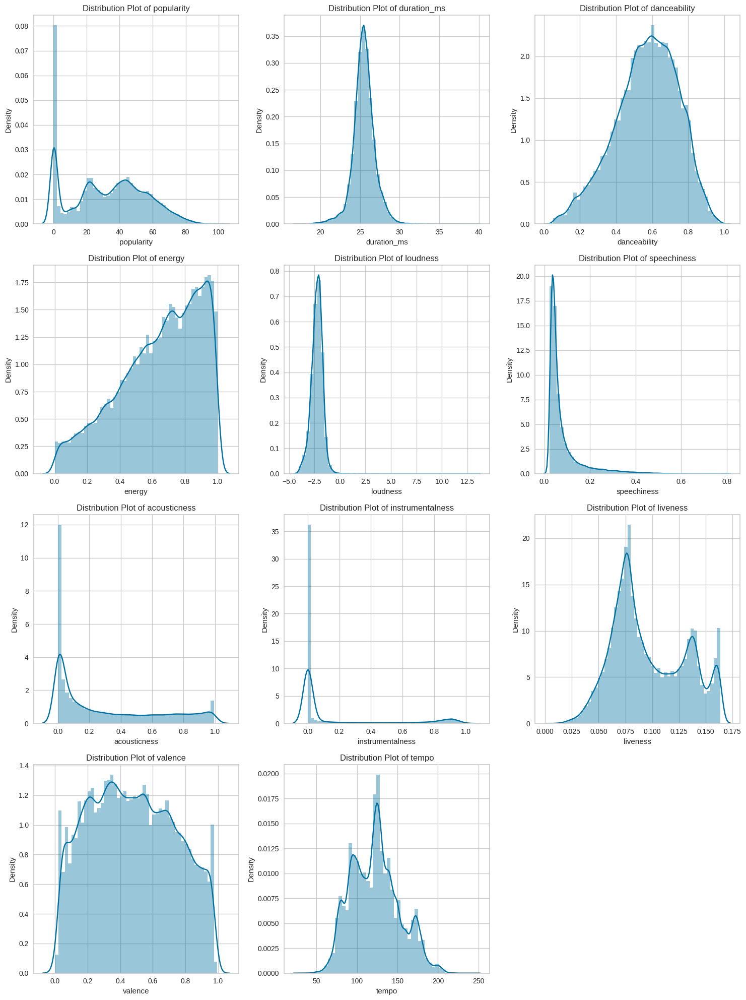

In [23]:
n_cols = len(numeric_cols)
n_rows = int(np.ceil(n_cols / 3))

fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5*n_rows))

for i, col in enumerate(numeric_cols):
    row_idx = i // 3
    col_idx = i % 3
    sns.distplot(transformed_data[col], ax=axes[row_idx, col_idx], kde=True)

    axes[row_idx, col_idx].set_title(f"Distribution Plot of {col}")
    axes[row_idx, col_idx].set_xlabel(col)

for i in range(n_cols, n_rows*3):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()
plt.show()

These multiple **distribution plots** (also known as **kernel density plots** or histograms with a density curve). Each plot represents the distribution of a specific feature in your dataset, likely related to audio or song features (similar to those seen in Spotify or other music-related datasets). Let’s go through the details of each plot.

1. **Popularity**
   - **Shape:** The distribution of popularity is multimodal, meaning there are multiple peaks. The highest density is around the lower popularity scores (between 0 and 20), with smaller peaks in the middle and higher popularity ranges.
   - **Skewness:** It is slightly right-skewed with a large concentration of songs at the lower popularity range and a smaller concentration at higher popularity values (closer to 100).

2. **Duration (duration_ms)**
   - **Shape:** This distribution is unimodal with a sharp peak, suggesting that most songs have a similar duration (around 20-30 minutes, likely in milliseconds).
   - **Skewness:** The distribution is slightly left-skewed, with most songs having a typical length, and very few longer or shorter songs.

3. **Danceability**
   - **Shape:** Danceability shows a relatively symmetrical bell-shaped distribution, peaking around 0.6 to 0.7. This indicates that most songs have moderate danceability.
   - **Range:** The range spans from close to 0 to 1, indicating that there is a wide variety of songs in terms of danceability.

4. **Energy**
   - **Shape:** The energy distribution has a steady increase and peaks around 0.8 to 1.0, indicating that most songs are energetic.
   - **Skewness:** The distribution is slightly left-skewed, meaning that fewer songs have low energy.

5. **Loudness**
   - **Shape:** The loudness distribution is centered around -5 dB, with a sharp peak at that value. This suggests that most songs have similar loudness levels.
   - **Skewness:** The distribution is right-skewed, indicating that there are some songs that are quieter than the majority of the data.

6. **Speechiness**
   - **Shape:** The speechiness distribution is heavily right-skewed, with most songs having very low speechiness values (close to 0). This indicates that the majority of songs have very few spoken words or are mostly instrumental.
   - **Outliers:** There are a few songs with high speechiness (closer to 1.0), likely spoken word tracks or podcasts.

7. **Acousticness**
   - **Shape:** Acousticness is strongly right-skewed, meaning most songs have low acousticness scores (closer to 0). This indicates that most songs are more electronically produced or processed.
   - **Outliers:** There are a few outliers with high acousticness (closer to 1.0), which are likely acoustic or unplugged tracks.

8. **Instrumentalness**
   - **Shape:** The distribution of instrumentalness is heavily right-skewed, with the majority of songs having a value close to 0. This suggests that most songs contain vocals.
   - **Outliers:** There are some outliers with higher instrumentalness values, which likely correspond to purely instrumental tracks.

9. **Liveness**
   - **Shape:** The liveness distribution is also right-skewed, with most songs having low liveness scores (close to 0). This suggests that most songs are recorded in studios rather than live environments.
   - **Peaks:** There are a few peaks in the distribution, indicating that some songs are recorded live, with higher liveness scores.

10. **Valence**
   - **Shape:** The valence distribution is relatively uniform, suggesting that there is a balanced mix of positive and negative emotional content across the songs in the dataset.
   - **Symmetry:** The distribution is approximately symmetric, centered around 0.5, indicating a balanced distribution of valence.

11. **Tempo**
   - **Shape:** The tempo distribution is multimodal, indicating that there are distinct clusters of songs with specific tempos (e.g., around 50 BPM, 100 BPM, and 150 BPM).
   - **Spread:** There is a wide range of tempos across songs, from very slow to very fast.


These distribution plots give a clear picture of how various audio features are distributed across the dataset:
- **Right-Skewed Features:** Features like `speechiness`, `acousticness`, `instrumentalness`, and `liveness` are heavily right-skewed, meaning most songs have low values for these features.
- **Bimodal or Multimodal Features:** Some features, like `popularity` and `tempo`, exhibit multimodal distributions, suggesting the presence of distinct clusters within the data.
- **Symmetric Features:** Features like `danceability` and `valence` show relatively symmetric distributions, indicating a balanced range of values across songs.

These insights help in understanding the characteristics of the songs in the dataset and can guide further analysis or modeling steps, such as clustering or classification.

## KS Test

In [24]:
data = transformed_data[numeric_cols]

for col in data.columns:
    kstest_result = stats.kstest(data[col], 'norm')

    print(f"{col} - K-S test statistic:", kstest_result.statistic)
    print(f"{col} - p-value:", kstest_result.pvalue)
    print('\n')

popularity - K-S test statistic: 0.8289032371700397
popularity - p-value: 0.0


duration_ms - K-S test statistic: 1.0
duration_ms - p-value: 0.0


danceability - K-S test statistic: 0.5529085884415816
danceability - p-value: 0.0


energy - K-S test statistic: 0.5140476758003281
energy - p-value: 0.0


loudness - K-S test statistic: 0.8779776619104455
loudness - p-value: 0.0


speechiness - K-S test statistic: 0.5089964736717827
speechiness - p-value: 0.0


acousticness - K-S test statistic: 0.5
acousticness - p-value: 0.0


instrumentalness - K-S test statistic: 0.5
instrumentalness - p-value: 0.0


liveness - K-S test statistic: 0.5075470218349193
liveness - p-value: 0.0


valence - K-S test statistic: 0.5077847978416873
valence - p-value: 0.0


tempo - K-S test statistic: 1.0
tempo - p-value: 0.0




The output is from performing the **Kolmogorov-Smirnov (K-S) test** on different features in the dataset. The **K-S test** is a non-parametric test that compares a sample distribution with a reference probability distribution (often a uniform or normal distribution). The test yields two key statistics:

- **K-S Test Statistic**: This value measures the distance between the empirical distribution of the data and the reference distribution. A value close to 1 indicates a significant deviation from the reference distribution, whereas a value close to 0 indicates a closer fit.
- **p-value**: This value helps determine whether the deviation between the empirical and reference distribution is statistically significant. A very small p-value (typically less than 0.05) suggests that the empirical distribution differs significantly from the reference distribution.

**Interpretation**

1. **Test Statistics**:
   - Almost all features have high K-S statistics, close to 0.5 or above. This indicates that the empirical distributions of these features are significantly different from the reference distribution (likely normal or uniform).
   - Some features, like `duration_ms` and `tempo`, have test statistics very close to 1, indicating an extreme deviation from the reference distribution.

2. **p-values**:
   - The p-values for all features are 0.0 (or close to 0). This means that the null hypothesis (which assumes that the data follows the reference distribution) can be rejected with very high confidence. In other words, the data distributions for all the features significantly differ from the reference distribution.

**Significance**
- The K-S test results show that none of the features in your dataset follow the assumed reference distribution. This is important because many machine learning models, such as linear regression or certain types of classifiers, assume that the features follow a specific distribution (e.g., normal). Therefore, these results suggest that:
  - **Standardization/Normalization**: You might need to apply normalization or standardization techniques to transform your features into a more normal-like distribution.
  - **Model Choice**: Consider using models that do not assume normality in the data, such as tree-based models (Random Forest, Gradient Boosting) or neural networks, which are less sensitive to the distribution of the features.

**Specific Features**
- **Features with K-S Statistic = 1 (e.g., `duration_ms`, `tempo`)**: These features have distributions that are completely different from the reference distribution, so further transformations like log-scaling, standard scaling, or even feature engineering might be necessary.

The K-S test results highlight that most of your features do not follow the assumed reference distribution. Depending on your machine learning model, you may need to apply transformations, use more flexible algorithms that don't assume normality, or conduct further exploration to understand the nature of each feature better.

## Distribution through Various Transformation

In [25]:
new_df = pd.DataFrame()

for col_name in numeric_cols:
    new_df[f'log({col_name})'] = np.log1p(transformed_data[col_name])
    new_df[f'sqrt({col_name})'] = np.sqrt(transformed_data[col_name])
    new_df[f'exp({col_name})'] = np.exp(transformed_data[col_name])

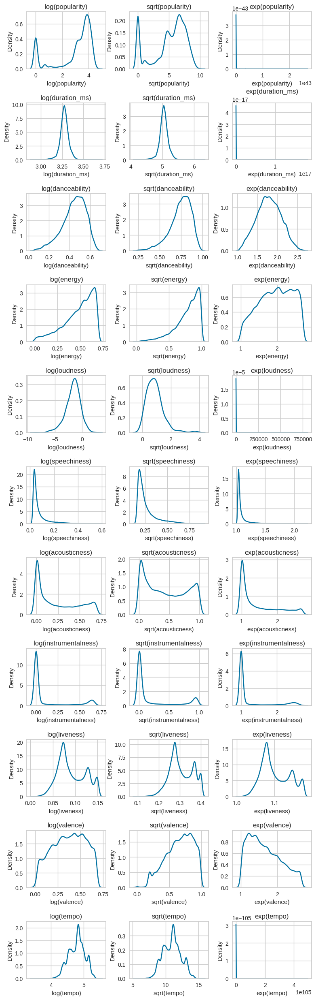

In [26]:
plot_cols = 3

fig_width = 8
fig_height = 25
subplot_width = fig_width / plot_cols
subplot_height = fig_height / (len(numeric_cols) / plot_cols)

fig, axes = plt.subplots(len(numeric_cols), plot_cols, figsize=(fig_width, fig_height))

for i, col_name in enumerate(numeric_cols):
    for j, transform in enumerate(['log', 'sqrt', 'exp']):
        plot_data = new_df[f"{transform}({col_name})"]
        plot_title = f"{transform}({col_name})"
        ax = axes[i, j]
        sns.kdeplot(plot_data, ax=ax)
        ax.set_title(plot_title)

plt.tight_layout()
plt.subplots_adjust(hspace=0.6, wspace=0.3)
plt.show()

This image shows multiple sets of **transformed distribution plots** for various features. For each feature (e.g., **popularity**, **duration_ms**, **danceability**, etc.), the distribution has been transformed using three different mathematical transformations: logarithmic (log), square root (sqrt), and exponential (exp). These transformations are commonly applied in data preprocessing to normalize data or handle skewed distributions.

**Purpose of the Transformations**

1. **Log Transformation (`log`)**:
   - **Purpose:** This transformation is typically used to reduce the skewness of data, compressing the scale of large values while preserving the order of the data.
   - **Application:** Useful when the data has long tails or extreme values that need to be scaled down.

2. **Square Root Transformation (`sqrt`)**:
   - **Purpose:** This transformation also compresses the scale of data but is less aggressive than the log transformation. It is commonly used when dealing with moderate skewness or to stabilize variance.
   - **Application:** Often used when the data contains positive values and is right-skewed.

3. **Exponential Transformation (`exp`)**:
   - **Purpose:** This transformation is generally used to expand the scale of the data, which can exaggerate differences between values.
   - **Application:** It is rarely used for normalization but could be used for increasing the separation between values when necessary.

**Explanation of Each Row in the Image**

1. **Popularity**:
   - **Log Transformation:** Shows a more compressed distribution with less skewness.
   - **Square Root Transformation:** The distribution is still bimodal, but the values are compressed towards the center.
   - **Exponential Transformation:** The distribution appears extremely skewed, with an extremely large outlier due to the exponential function inflating the values.

2. **Duration (duration_ms)**:
   - **Log Transformation:** Smooths out the sharp peak in the original distribution and reduces the scale.
   - **Square Root Transformation:** Compresses the values and reduces the extreme differences, but retains the peak.
   - **Exponential Transformation:** Produces an extremely sharp peak with a long tail, as the exponential transformation dramatically inflates the values.

3. **Danceability**:
   - **Log and Square Root:** Both transformations help in compressing the data, reducing the range of the feature.
   - **Exponential Transformation:** The range is drastically expanded, producing a sharp peak near 0 and rapidly inflating higher values.

4. **Energy**:
   - **Log Transformation:** Smooths the distribution and reduces skewness.
   - **Square Root Transformation:** Compresses the data but retains the original shape.
   - **Exponential Transformation:** Results in a sharp peak near lower values, which may make the distribution less interpretable.

5. **Loudness**:
   - **Log Transformation:** Smooths the distribution, pulling in extreme values.
   - **Square Root Transformation:** Compresses the range of the distribution, reducing the scale of differences in loudness.
   - **Exponential Transformation:** The extreme nature of this transformation results in an outlier-heavy distribution.

6. **Speechiness**:
   - **Log and Square Root Transformations:** Both transformations help to manage the skewed nature of the original data, compressing the scale.
   - **Exponential Transformation:** Expands the distribution, producing a long tail towards high values.

7. **Acousticness**:
   - **Log and Square Root Transformations:** Both transformations compress the data, reducing skewness and the range of the values.
   - **Exponential Transformation:** Results in a sharp peak, expanding the values drastically.

8. **Instrumentalness**:
   - **Log and Square Root Transformations:** These help to make the data more normally distributed, reducing the concentration of values near 0.
   - **Exponential Transformation:** Results in a sharp peak and extreme inflation of values.

9. **Liveness**:
   - **Log and Square Root Transformations:** These help to reduce the skewness, compressing the scale of the values.
   - **Exponential Transformation:** Expands the range of values drastically, making it harder to interpret.

10. **Valence**:
   - **Log and Square Root Transformations:** Both transformations help to reduce the spread of values, making the distribution more normal.
   - **Exponential Transformation:** Expands the values, creating a sharp peak near the lower range.

11. **Tempo**:
   - **Log and Square Root Transformations:** These reduce the spread and smooth out the distribution, compressing extreme values.
   - **Exponential Transformation:** Expands the data, resulting in a highly skewed distribution.

**General Insights**
- **Logarithmic and Square Root Transformations:** Both transformations are effective in reducing skewness, compressing extreme values, and making the distributions more normal or symmetric. These are typically used when data has a long tail or when extreme values could skew the results of a model.
  
- **Exponential Transformation:** The exponential transformation expands the scale of the data and may not be appropriate for normalization or making data more interpretable. It tends to produce more extreme values and can distort the distribution, leading to heavily skewed plots.

These transformations can help in data preprocessing by making the data more suitable for machine learning models, especially those sensitive to non-normal distributions like linear regression or algorithms requiring normalized data.

## Distribution of the Target Variable (Popularity)

<Figure size 1800x1200 with 0 Axes>

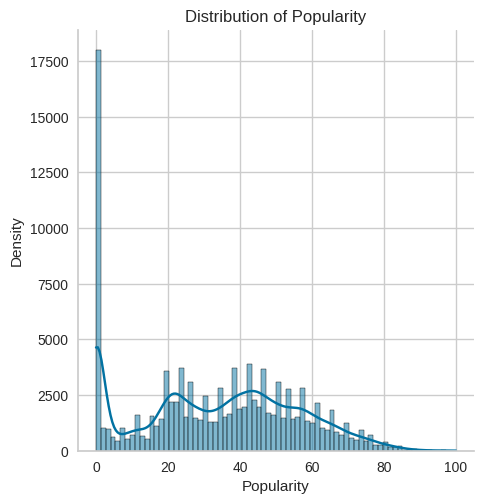

In [27]:
plt.figure(figsize=(18, 12))
sns.displot(final_data['popularity'], kde=True)
plt.title('Distribution of Popularity')
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.show()

This plot is a **histogram** with a **density plot** overlaid, showing the **distribution of the `Popularity` feature** in the dataset. Here's how to interpret it:

**Key Observations**
1. **Y-axis (Density)**: This axis shows the frequency or count of songs that fall into different popularity ranges. The large peak at the beginning indicates that there are many songs with very low popularity.

2. **X-axis (Popularity)**: This axis represents the popularity score of the songs, likely on a scale from 0 to 100 (common for such features in music datasets).

3. **Distribution Shape**:
   - **Right-Skewed Distribution**: The distribution is heavily right-skewed, meaning that the majority of the songs have low popularity scores, and only a small proportion of songs have high popularity.
   - The large spike at the far left near a popularity score of 0 suggests that many songs are either very unpopular or new, potentially having little exposure or engagement.
   - As the popularity score increases, the frequency of songs decreases, with fewer songs achieving very high popularity.

4. **Density Curve**:
   - The density curve smooths the histogram to show the general trend of the distribution. It reflects the overall skewness and highlights the fact that the distribution tapers off as popularity increases.

**Interpretation**
- **Long Tail**: This distribution suggests a classic "long tail" scenario in the music industry, where a small number of songs achieve high popularity, while the majority of songs remain relatively unknown.
- **Data Imbalance**: The imbalance in the popularity distribution might impact machine learning models. For example, predicting highly popular songs may be more difficult due to the scarcity of such examples in the dataset.
- **Possible Actions**:
  - **Feature Transformation**: A log transformation or other scaling techniques might be considered to handle the skewness.
  - **Balancing Strategies**: In modeling, you might consider techniques to handle the class imbalance, such as resampling (oversampling or undersampling) or using class-weighted algorithms.

Overall, this plot shows that most songs in the dataset have low popularity, which could influence our approach to modeling and evaluation.

## Relation with the Target Variable

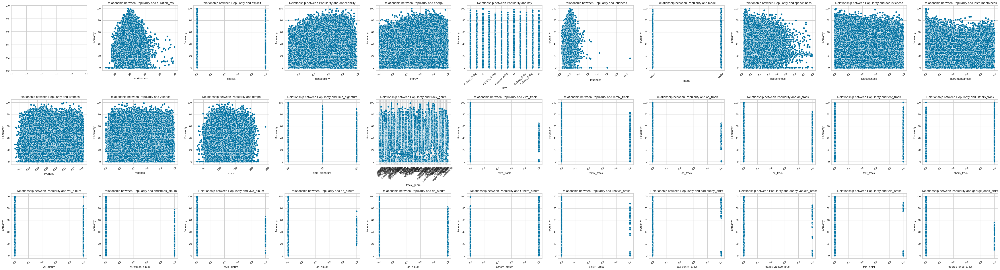

In [28]:
import math

num_features = len(transformed_data.columns) - 1
num_rows = 3
num_cols = math.ceil(num_features / num_rows)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 15))

feature_index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if feature_index < num_features:
            feature = transformed_data.columns[feature_index]
            if feature != 'popularity':
                sns.scatterplot(x=feature, y='popularity', data=transformed_data, ax=axes[row, col])
                axes[row, col].set_title(f'Relationship between Popularity and {feature}')
                axes[row, col].set_xlabel(feature)
                axes[row, col].set_ylabel('Popularity')
                axes[row, col].tick_params(axis='x', rotation=45)
            feature_index += 1
        else:
            fig.delaxes(axes[row, col])

fig.tight_layout()
plt.show()

This image contains a grid of **scatter plots**, each representing the relationship between the `Popularity` feature and other features in your dataset. Scatter plots are useful for visualizing the relationship between two continuous variables, and they help identify trends, correlations, and patterns in the data.

**Interpretation**

1. **Popularity vs. Other Features**:
   - Each scatter plot shows the relationship between **`Popularity`** (on the y-axis) and a specific feature (on the x-axis). The scatter plots are used to observe how the values of each feature relate to the popularity of a track.
   
2. **General Trends**:
   - **For Continuous Features** (e.g., `duration_ms`, `danceability`, `energy`, `loudness`, `valence`, etc.):
     - The scatter plots generally show a **random spread** of points with no clear linear relationship between these features and `Popularity`.
     - For example, the relationship between `Popularity` and `duration_ms` shows that songs with various durations span the entire range of popularity, indicating no obvious correlation.
     - Similarly, for features like `danceability`, `energy`, and `valence`, popularity seems to be spread across a wide range of values, showing that these features do not have a strong influence on popularity by themselves.

3. **Categorical/Binary Features**:
   - For binary or categorical features such as **`track_genre`, `The_album`, `You_track`, and artist-related features**:
     - The scatter plots display vertical lines or clusters of points, as these features take on discrete values (e.g., 0 or 1). These plots show that most tracks belong to a specific group or are associated with the category "Others" rather than specific named artists or albums.
     - For example, in the scatter plot of `Popularity` vs. `artist_The Beatles`, most tracks have a `Popularity` score of 0, with only a few outliers at higher popularity values.

4. **Key Observations**:
   - **No Strong Linear Correlations**: Based on these scatter plots, it appears that none of the individual features have a strong linear correlation with `Popularity`. The data points are dispersed randomly across the popularity spectrum, suggesting that the relationship between `Popularity` and these features is likely non-linear or may require interaction between multiple features to be meaningful.
   - **Outliers**: In some plots (e.g., `loudness`, `track_genre`), there are distinct outliers, which could represent songs that deviate significantly from the general trend. These outliers might warrant further investigation as they could have specific characteristics leading to high or low popularity.
   
**Possible Implications for Modeling**
- **Feature Engineering**: The scatter plots indicate that no single feature strongly predicts popularity, so it may be necessary to explore feature interactions or transformations. You might also consider using more complex models (e.g., tree-based models or neural networks) that can capture non-linear relationships.
- **Handling Categorical Data**: For the categorical and binary features, one-hot encoding or similar encoding techniques will likely be required for modeling.
- **Outlier Treatment**: Some scatter plots suggest the presence of outliers, particularly in features like `loudness`. Depending on the model you choose, it may be beneficial to address these outliers.

In summary, these scatter plots provide an overview of how each feature relates to `Popularity`, suggesting that the relationship between features and popularity is complex and may require advanced modeling techniques to capture effectively.

## Distribution of the Categorical Variables

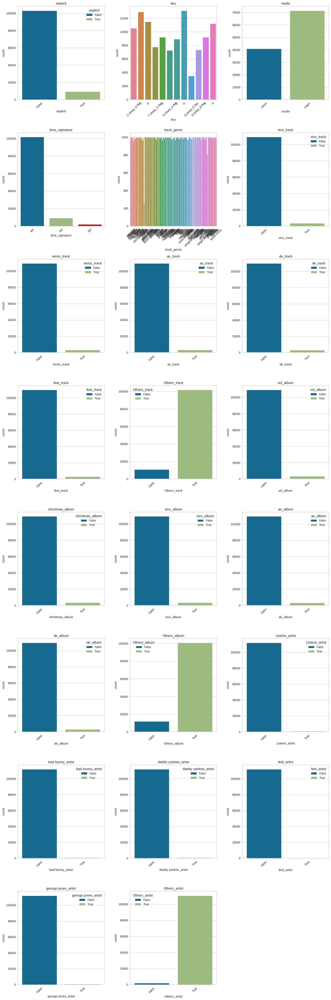

In [29]:
n_cols = 3
n_rows = math.ceil(len(categorical_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))

for i, column in enumerate(categorical_cols):
    row = i // n_cols
    col = i % n_cols

    sns.countplot(x=column,
                  data=transformed_data.loc[:, categorical_cols],
                  hue=column,
                  ax=axes[row, col])

    current_ticks = axes[row, col].get_xticks()
    current_tick_labels = axes[row, col].get_xticklabels()

    axes[row, col].set_xticks(current_ticks,
                              labels=current_tick_labels,
                              rotation=45)
    axes[row, col].set_title(column)

for i in range(len(categorical_cols), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

These plots represent **count plots** (also known as bar plots) for various categorical features in the dataset. Each plot displays the frequency of each category within the feature. Let’s break down the different plots shown in the image:

1. **Explicit**
   - This plot shows the count of songs that are **explicit** (`True`) versus those that are not (`False`).
   - **Insight:** There are far more non-explicit songs compared to explicit ones.

2. **Key**
   - This plot shows the distribution of songs across different musical **keys** (C, C-sharp/D-flat, D, etc.).
   - **Insight:** There is a relatively balanced distribution across keys, though some keys are more common (e.g., C major, G major) than others.

3. **Mode**
   - This plot shows the count of songs in the **major** and **minor** musical modes.
   - **Insight:** There are significantly more songs in the major mode than in the minor mode.

4. **Time Signature**
   - This plot displays the count of songs with different **time signatures**.
   - **Insight:** The vast majority of songs have a 4/4 time signature, with much smaller counts for other time signatures like 3/4 and 5/4.

5. **Track Genre**
   - This plot shows the distribution of songs across various **genres**.
   - **Insight:** There are numerous genres represented, but no individual genre appears to dominate the dataset.

6. **The Track, You Track, Me Track, I Track, Vivo Track, Others Track**
   - These plots represent whether the song contains certain specific words in the track title (e.g., "The", "You", "Me", "I", "Vivo", or "Others").
   - **Insight:** The vast majority of tracks do not contain these specific words in their titles, with a small fraction that do.

7. **The Album, Vol Album, Vivo Album, Ao Album, Christmas Album, Others Album**
   - These plots are similar to the track title plots but instead show whether the album title contains certain words (e.g., "The", "Vol", "Vivo", "Ao", "Christmas", "Others").
   - **Insight:** The dataset contains a relatively small number of albums with these specific words in their titles, with most albums falling into the "False" category.

8. **Artists (The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, Others)**
   - These plots show whether a song is attributed to a specific artist (e.g., The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, or others).
   - **Insight:** The vast majority of songs in the dataset are attributed to "Others" (not these specific artists). Only a small fraction of the dataset contains songs by these named artists.

**General Observations**
- **Imbalanced Categories:** In many of these features, one category dominates the others. For example, most songs are non-explicit, have a 4/4 time signature, and do not contain specific words in their titles or albums. Similarly, the "Others" category dominates the artist-related plots, indicating that the dataset includes many songs from artists who are not among the specific artists highlighted in the plot.
  
- **Balanced Categories:** The **key** and **genre** plots show more balanced distributions, indicating a diverse range of musical keys and genres represented in the dataset.

**Use Cases**
- **Data Preprocessing:** These plots can help identify imbalances in the dataset, which could inform decisions about data preprocessing (e.g., whether to balance the dataset).
- **Feature Importance:** Some features, such as **mode** and **key**, may have more influence on models related to music analysis, such as genre classification or popularity prediction.

Overall, these count plots provide insights into the distribution of categorical features in the dataset, helping to understand the structure of the data before further analysis or modeling.

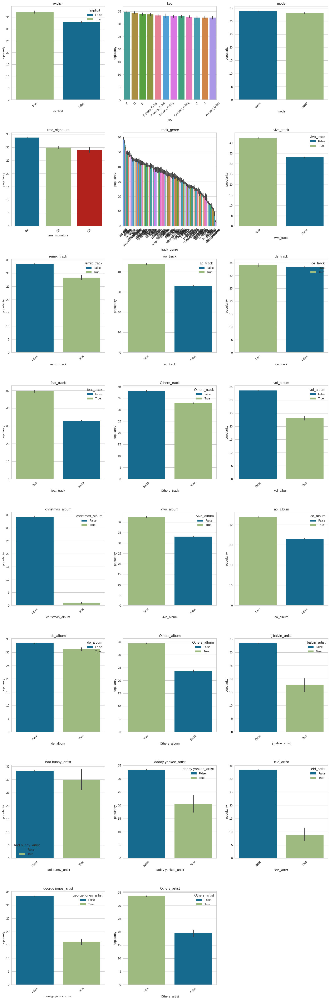

In [30]:
n_cols = 3
n_rows = math.ceil(len(categorical_cols) / n_cols)

fig, axes = plt.subplots(n_rows,
                         n_cols,
                         figsize=(16, 6 * n_rows))

for i, column in enumerate(categorical_cols):
    row = i // n_cols
    col = i % n_cols

    order = transformed_data.groupby(column)['popularity'].mean().sort_values(ascending=False).index

    sns.barplot(x=column,
                y='popularity',
                data=transformed_data,
                estimator=np.mean,
                hue=column,
                order=order,
                ax=axes[row, col])

    axes[row, col].set_title(column)
    axes[row, col].tick_params(axis='x',
                               rotation=45)


for i in range(len(categorical_cols), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

These are **bar plots** that depict the relationship between different categorical features and the **mean popularity** of songs. Each plot shows how the average popularity varies across different categories within the feature. Let's go through them one by one:

1. **Explicit**
   - **Insight:** The mean popularity of explicit songs is slightly higher than that of non-explicit songs.

2. **Key**
   - **Insight:** The mean popularity across different musical keys is relatively similar, with slight variations. No particular key seems to have a significantly higher or lower mean popularity.

3. **Mode**
   - **Insight:** The mean popularity of songs in the major mode is almost identical to the mean popularity of songs in the minor mode.

4. **Time Signature**
   - **Insight:** The mean popularity for songs with a 4/4 time signature is slightly higher than for songs with other time signatures (such as 3/4 and 5/4).

5. **Track Genre**
   - **Insight:** There is a noticeable variation in the mean popularity across different genres. Some genres have much higher average popularity than others. The plot shows a descending order of popularity, indicating which genres tend to be more popular on average.

6. **The Track, You Track, Me Track, I Track, Vivo Track, Others Track**
   - These plots compare the mean popularity of songs based on whether they contain specific words (e.g., "The", "You", "Me", "I", "Vivo", "Others") in their titles.
   - **Insight:** In most cases, songs that contain these specific words in the title have very similar mean popularity to those that do not. For example, the popularity of songs with "The" in the title is nearly the same as songs without it.

7. **The Album, Vol Album, Vivo Album, Ao Album, Christmas Album, Others Album**
   - These plots compare the mean popularity of songs based on whether their album titles contain specific words.
   - **Insight:** The average popularity does not differ much between albums that contain these specific words and those that do not. However, albums labeled "Christmas album" seem to have slightly higher mean popularity compared to non-Christmas albums.

8. **Artists (The Beatles, George Jones, Stevie Wonder, Ella Fitzgerald, Linkin Park, Others)**
   - These plots show the mean popularity of songs attributed to specific artists compared to songs attributed to other artists (categorized as "False").
   - **Insight:** In most cases, songs from "The Beatles", "George Jones", "Stevie Wonder", "Ella Fitzgerald", and "Linkin Park" have lower average popularity compared to songs by other artists. This may indicate that, in this dataset, the songs from these iconic artists tend to be less popular than those by other artists.

**General Observations**
- **Balanced Features:** For most features (e.g., explicit, key, mode, time signature), the mean popularity is relatively consistent across categories, indicating that these features do not have a strong influence on popularity.
  
- **Genre-Specific Insights:** The **track genre** feature shows significant variability in popularity, suggesting that genre may be a more important determinant of popularity compared to features like key or mode.

- **Word Presence in Titles/Albums:** The presence of specific words in track or album titles does not seem to have a strong impact on the popularity of the songs.


These bar plots help to understand how categorical features correlate with the average popularity of songs. While some features like **genre** seem to have a noticeable impact on popularity, others such as **mode** and **time signature** appear to have little effect. This insight could be valuable for building predictive models or making decisions related to song recommendation or content creation.

# Feature Engineering 2

In [31]:
track_cols = [col for col in transformed_data.columns if col.endswith('_track')]
album_cols = [col for col in transformed_data.columns if col.endswith('_album')]
artist_cols = [col for col in transformed_data.columns if col.endswith('_artist')]

for col in track_cols + album_cols + artist_cols:
    transformed_data[col] = transformed_data[col].astype(int)

In [32]:
print(transformed_data.head())

   popularity  duration_ms  explicit  danceability  energy             key  \
0          73    25.770517     False         0.676  0.4610  C-sharp_D-flat   
1          55    24.176230     False         0.420  0.1660  C-sharp_D-flat   
2          57    25.433194     False         0.438  0.3590               C   
3          71    25.272703     False         0.266  0.0596               C   
4          82    25.215646     False         0.618  0.4430               D   

   loudness   mode  speechiness  acousticness  ...  vivo_album  ao_album  \
0 -2.194176  minor       0.1430        0.0322  ...           0         0   
1 -3.204876  major       0.0763        0.9240  ...           0         0   
2 -2.572481  major       0.0557        0.2100  ...           0         0   
3 -3.287467  major       0.0363        0.9050  ...           0         0   
4 -2.566679  major       0.0526        0.4690  ...           0         0   

   de_album  Others_album j balvin_artist bad bunny_artist  \
0         0 

In [33]:
transformed_data.iloc[:, -18:].describe()

,vivo_track,remix_track,ao_track,de_track,feat_track,Others_track,vol_album,christmas_album,vivo_album,ao_album,de_album,Others_album,j balvin_artist,bad bunny_artist,daddy yankee_artist,feid_artist,george jones_artist,Others_artist
count,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000,112114.000000
mean,0.027972,0.026518,0.025394,0.022896,0.023075,0.906042,0.028676,0.027490,0.028079,0.025742,0.024181,0.897239,0.004549,0.003711,0.003345,0.003104,0.003050,0.984480
std,0.164892,0.160670,0.157319,0.149574,0.150142,0.291771,0.166895,0.163507,0.165198,0.158364,0.153611,0.303648,0.067293,0.060801,0.057738,0.055627,0.055147,0.123609
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Removing Auto-Correlation

In [34]:
class RemoveAutoCorr(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.7):
        self.threshold = threshold
        self.columns_to_drop_ = []

    def fit(self, X, y=None):
        # Select only numeric and boolean columns
        X_numeric_bool = X.select_dtypes(include=['int64', 'float64', 'bool'])

        # Step 1: Calculate the correlation matrix
        corr_matrix = X_numeric_bool.corr().abs()

        # Step 2: Identify the upper triangle of the correlation matrix
        upper_triangle = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
        upper_triangle_corr = corr_matrix.where(upper_triangle)

        # Step 3: Find columns to drop based on the threshold
        self.columns_to_drop_ = [column for column in upper_triangle_corr.columns if any(upper_triangle_corr[column] >= self.threshold)]

        return self

    def transform(self, X, y=None):
        # Step 4: Drop the highly correlated columns
        return X.drop(columns=self.columns_to_drop_, errors='ignore')

In [35]:
remove_autocorr_pipeline = Pipeline([
    ('remove_autocorr', RemoveAutoCorr(threshold=0.7))
])

df_transformed = remove_autocorr_pipeline.fit_transform(transformed_data)

In [36]:
df_transformed.shape

(112114, 29)

In [37]:
df_transformed.head()

,popularity,duration_ms,explicit,danceability,energy,key,mode,speechiness,instrumentalness,liveness,...,vol_album,christmas_album,de_album,Others_album,j balvin_artist,bad bunny_artist,daddy yankee_artist,feid_artist,george jones_artist,Others_artist
0,73,25.770517,False,0.676,0.4610,C-sharp_D-flat,minor,0.1430,0.000001,0.139735,...,0,0,0,1,0,0,0,0,0,1
1,55,24.176230,False,0.420,0.1660,C-sharp_D-flat,major,0.0763,0.000006,0.073024,...,0,0,0,1,0,0,0,0,0,1
2,57,25.433194,False,0.438,0.3590,C,major,0.0557,0.000000,0.080764,...,0,0,0,1,0,0,0,0,0,1
3,71,25.272703,False,0.266,0.0596,C,major,0.0363,0.000071,0.087346,...,0,0,0,1,0,0,0,0,0,1
4,82,25.215646,False,0.618,0.4430,D,major,0.0526,0.000000,0.063260,...,0,0,0,1,0,0,0,0,0,1


# Clustering

In [38]:
num_cols = df_transformed.select_dtypes(include=['int64', 'float64']).columns
df_scaled = df_transformed[num_cols].copy()

scaler = StandardScaler()
df_scaled[num_cols] = scaler.fit_transform(df_scaled)

## K-Means Clustering

In [39]:
wcss = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

### Elbow Curve

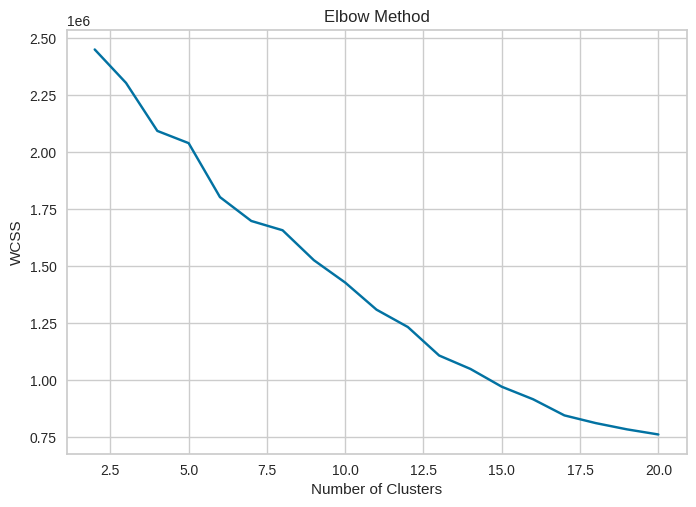

In [40]:
plt.plot(range(2, 21), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

This is an **Elbow Method plot** used for determining the optimal number of clusters for a K-Means clustering algorithm. The plot shows the **within-cluster sum of squares (WCSS)** on the Y-axis and the **number of clusters (K)** on the X-axis.

**Key Components**

- **WCSS (Within-Cluster Sum of Squares):**
  - WCSS measures the total squared distance between each point and the centroid of the cluster to which it belongs. It is a measure of how tightly grouped the clusters are.
  - As the number of clusters increases, WCSS decreases because the data points are grouped into smaller, tighter clusters.

- **Number of Clusters (K):**
  - The X-axis represents the number of clusters (`K`) being tested, ranging from 2 to 20 in this case.

**Elbow Method**
- The goal of the elbow method is to find the "elbow point" where adding more clusters does not significantly reduce WCSS. This point indicates the optimal number of clusters because it balances model complexity and accuracy.

**Interpretation of the Plot**
- **Steep Decline (Left Side of the Plot):** Initially, as the number of clusters increases, WCSS decreases rapidly. This is because the model is grouping the data points into more clusters, which reduces the variance within each cluster.
- **Elbow Point:** The "elbow" is the point where the rate of decrease slows down significantly. After this point, adding more clusters yields diminishing returns (i.e., WCSS decreases only slightly). In this plot, the elbow seems to be around **K = 8** or **K = 9** clusters. This indicates that 8 or 9 clusters may be the optimal number of clusters for this dataset.
- **After the Elbow (Right Side of the Plot):** After the elbow point, adding more clusters only marginally decreases WCSS, indicating that the additional clusters are not contributing much to reducing the within-cluster variance.



The optimal number of clusters is usually chosen at the elbow point. In this plot, it appears that **8 or 9 clusters** would be a reasonable choice for K-Means clustering, as this is where the WCSS begins to level off and adding more clusters doesn’t significantly improve the clustering outcome.

This method helps to avoid overfitting (by selecting too many clusters) while ensuring that the clusters are sufficiently well-defined.

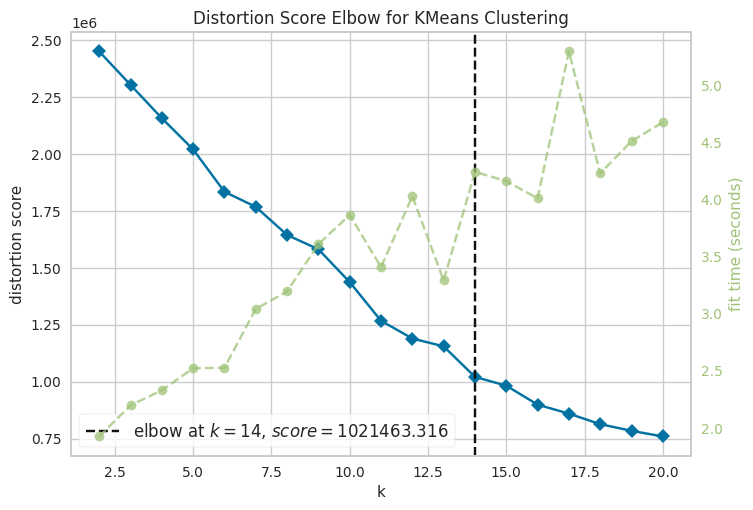

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
km_model = KMeans()
visualizer = KElbowVisualizer(km_model, k=(2, 21))
visualizer.fit(df_scaled)
visualizer.show()

This plot shows the **Elbow Method** for determining the optimal number of clusters (**k**) in **KMeans clustering**. Here's the breakdown of the elements in the plot:

***Key Components***
1. **Distortion Score (Y-axis on the left)**:
   - The distortion score (also known as **within-cluster sum of squares**, or **WCSS**) measures the total variance within each cluster. Lower distortion scores indicate that the points are closer to the cluster centroids.
   - On the **left Y-axis**, the distortion score decreases as the number of clusters increases (shown by the solid blue line with diamonds).
   - Initially, as `k` increases, the distortion score reduces rapidly. However, after a certain point, the rate of reduction slows down.

2. **Fit Time (Y-axis on the right)**:
   - The **right Y-axis** shows the time taken to fit the KMeans model (in seconds).
   - The **fit time** (green dotted line with circles) generally increases with `k`, as fitting more clusters typically requires more computation.

3. **Number of Clusters (X-axis)**:
   - The **X-axis** represents the number of clusters (`k`) for KMeans.
   - As `k` increases from 2 to 20, the distortion score decreases, and the fit time varies.

4. **Elbow Point**:
   - The **elbow point** is where the reduction in the distortion score starts to slow down significantly.
   - In this plot, the elbow point is at **k = 14** (marked by the vertical dashed black line). This is considered the optimal number of clusters.
   - At this point, the score is **1021463.316**, as indicated in the label in the bottom left of the graph.

***Interpretation***
- The **elbow method** helps to choose the best `k`. The idea is to select the value of `k` where adding more clusters doesn't significantly improve the model (i.e., doesn't reduce the distortion score much more).
- In this case, **k = 14** is likely the optimal number of clusters, as adding more clusters beyond this point does not significantly decrease the distortion score.
- The **fit time** shows how long the model took to fit for each value of `k`. It tends to increase with higher `k`, but there are some variations due to different factors influencing fit time.

### K=9 K-Means

In [41]:
kmeans_9 = KMeans(n_clusters = 9)
kmeans_9.fit(df_scaled)

KMeans(n_clusters=9)

In [ ]:
silhouette_avg_9 = silhouette_score(df_scaled, kmeans_9.labels_)
print("Average Silhouette Score:", silhouette_avg_9)

Average Silhouette Score: 0.13875953411811154


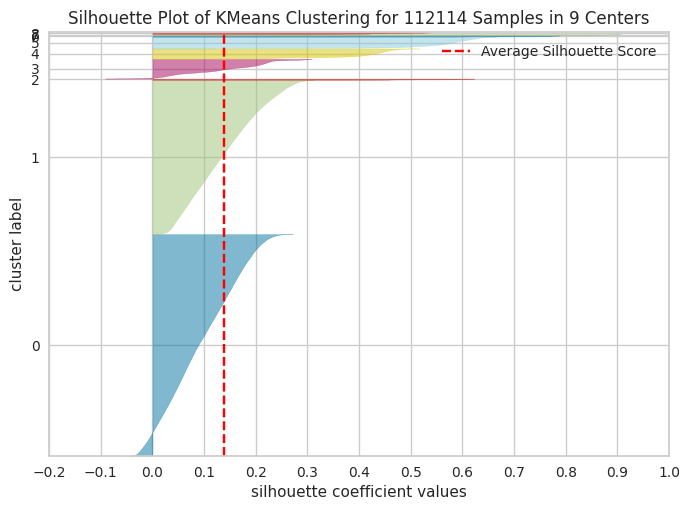

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 112114 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(kmeans_9, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

This plot is a **Silhouette Plot** for **KMeans Clustering**. It visualizes the **silhouette coefficient values** for individual samples, which provide insights into how well the samples are clustered.

***Key Elements in the Plot***

1. **X-axis (Silhouette Coefficient Values)**:
   - Represents the **silhouette coefficient values** for each sample, ranging from **-1 to 1**.
   - The **silhouette coefficient** measures how similar a point is to its own cluster compared to other clusters:
     - **1**: Perfectly assigned to its cluster.
     - **0**: The point is on or very close to the decision boundary between clusters.
     - **Negative values**: The point may be in the wrong cluster.

2. **Y-axis (Cluster Label)**:
   - Represents the different clusters formed by KMeans. Each row corresponds to a specific cluster, and the width of the shape in each row indicates the number of samples assigned to that cluster.
   - This plot is for **9 clusters** (as indicated by the title).

3. **Silhouette Shapes**:
   - Each colored region represents a different cluster. The width of each region corresponds to the number of samples in that cluster.
   - The **height** of each shape shows the silhouette coefficient values for the samples in that cluster.
     - A **wider silhouette** indicates that most points in that cluster have a high silhouette coefficient, meaning they are well-clustered.
     - **Narrower silhouettes** or negative values indicate poorly clustered points.

4. **Average Silhouette Score (Red Dashed Line)**:
   - The vertical **red dashed line** represents the **average silhouette score** across all samples.
   - The silhouette score provides an overall measure of how well the data is clustered. A higher average silhouette score (closer to 1) indicates better clustering.

***Interpretation***
- The **average silhouette score** (around 0.1–0.2) is **relatively low**, indicating that the clustering might not be very strong, and many samples could be close to decision boundaries between clusters.
- Some clusters have **negative silhouette values**, which suggests that some points in these clusters may be **misclassified** or are closer to other clusters than their own.
- Clusters with **positive silhouette scores** show that the points are generally well-clustered, with points having high similarity within their own cluster.

***Summary***
- The **silhouette coefficient values** help assess the quality of clustering. In this case, the average silhouette score is relatively low, indicating potential issues with cluster separation.
- Some clusters (e.g., cluster 0 and 1) have a relatively better silhouette shape, but others (e.g., some of the higher cluster labels) may not be as well-separated.

Let me know if you need more clarification or further analysis!

In [41]:
df_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112114 entries, 0 to 113999
Data columns (total 29 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   popularity           112114 non-null  int64  
 1   duration_ms          112114 non-null  float64
 2   explicit             112114 non-null  bool   
 3   danceability         112114 non-null  float64
 4   energy               112114 non-null  float64
 5   key                  112114 non-null  object 
 6   mode                 112114 non-null  object 
 7   speechiness          112114 non-null  float64
 8   instrumentalness     112114 non-null  float64
 9   liveness             112114 non-null  float64
 10  valence              112114 non-null  float64
 11  tempo                112114 non-null  float64
 12  time_signature       112114 non-null  object 
 13  track_genre          112114 non-null  object 
 14  vivo_track           112114 non-null  int64  
 15  remix_track          1

## DBSCAN Clustering

### Sampling

In [39]:
sample_size = 5000
random_indices = random.sample(range(df_transformed.shape[0]), sample_size)
sampled_df = df_transformed.iloc[random_indices]

print(sampled_df.shape)

(5000, 29)


### Pairwise Distance Matrix

In [40]:
dist_mat_1 = pairwise_distances(sampled_df.select_dtypes(include=['number']), metric='euclidean')

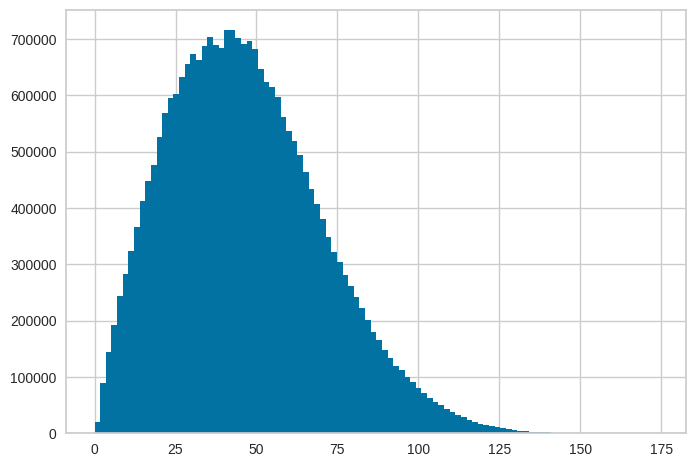

In [41]:
h = plt.hist(dist_mat_1.flatten(),bins=100)

<Axes: ylabel='Density'>

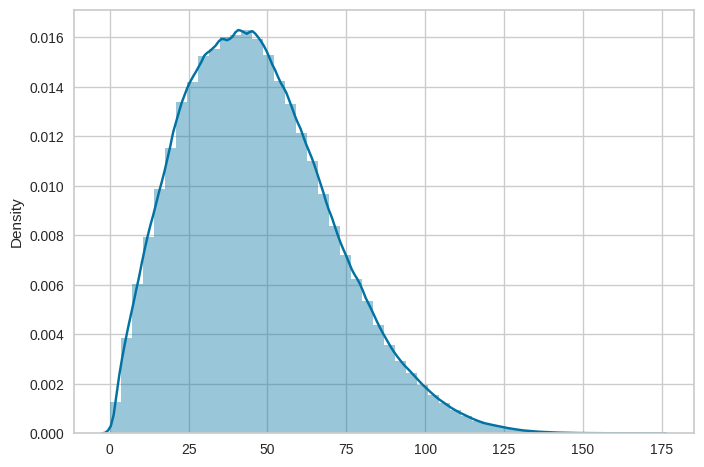

In [42]:
sns.distplot(dist_mat_1.flatten())

In [43]:
X = df_transformed.select_dtypes(include=['number'])

In [44]:
min_samples = 5
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

In [45]:
distances = np.sort(distances[:, min_samples-1], axis=0)

### K-Distance Plot

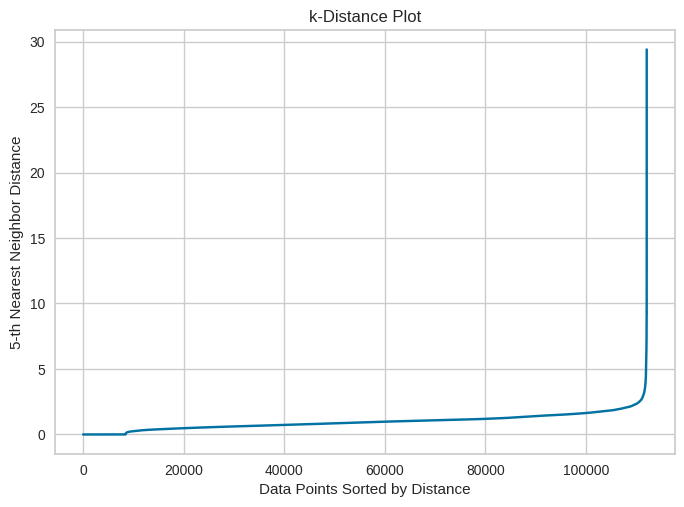

In [46]:
plt.plot(distances)
plt.xlabel('Data Points Sorted by Distance')
plt.ylabel(f'{min_samples}-th Nearest Neighbor Distance')
plt.title('k-Distance Plot')
plt.show()

This is a **k-distance plot** used in the context of the **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** algorithm. The plot is often used to help determine the optimal value for the `eps` parameter, which defines the radius of a neighborhood around a point for density-based clustering.

***Key Components of the Plot***

1. **X-Axis (Data Points Sorted by Distance):**
   - The X-axis represents the data points, sorted by their k-distance in ascending order. The k-distance refers to the distance between a point and its k-th nearest neighbor, in this case, the **5th nearest neighbor** (based on the plot title).

2. **Y-Axis (5-th Nearest Neighbor Distance):**
   - The Y-axis shows the distance to the 5-th nearest neighbor for each point.

3. **Shape of the Curve:**
   - The curve starts off relatively flat, indicating that the distances to the 5-th nearest neighbor are small and relatively consistent for many points.
   - At some point, the curve starts to rise more steeply, representing a transition where points are farther apart from their 5-th nearest neighbors.
   - The sharp rise at the end indicates that these points are potentially **outliers** or **border points** far from dense clusters.

***Interpretation in the Context of DBSCAN***

- **Elbow Point:** The goal is to identify the "elbow" in the plot, which is the point where the curve starts to steeply rise after being relatively flat. This elbow point corresponds to the optimal value of the `eps` parameter for DBSCAN. Below this threshold, points are in dense regions (within clusters), and above this threshold, points are in sparse regions (potential outliers or noise).
  
  - In this plot, the elbow appears to be around a distance of **2 to 3** on the Y-axis. This suggests that setting `eps` in the range of **2 to 3** could be a reasonable starting point for DBSCAN.

- **Flat Region:** The flat portion of the curve indicates that within this range, points have a consistent and relatively small distance to their neighbors, meaning they are likely part of dense clusters.

- **Steep Region:** The steep portion of the curve represents points that are farther apart from their neighbors, which could either be sparsely located points or outliers. In DBSCAN, points with distances higher than `eps` would not be considered part of a core point's neighborhood and might be classified as noise.

***Practical Usage***
- To set `eps`, you should choose a value near the elbow point. In this case, a value of `eps ≈ 2.5` seems like a good candidate because it represents a threshold where the distance to the 5-th nearest neighbor starts to increase significantly, suggesting that beyond this distance, points are no longer part of dense regions.


This **k-distance plot** helps you visually determine the value of `eps` for DBSCAN by identifying the point where the curve changes slope (the elbow point). In this case, an `eps` value around **2 to 3** seems appropriate based on the location of the elbow in the plot.

### DBSCAN Clustering

In [47]:
class DBSCANClustering(BaseEstimator, TransformerMixin):
    def __init__(self, eps=0.3, min_samples=5, features=None):
        self.eps = eps
        self.min_samples = min_samples
        self.features = features
        self.dbscan = DBSCAN(eps=self.eps, min_samples=self.min_samples)

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X = X.copy()

        # Apply DBSCAN clustering
        X_scaled = StandardScaler().fit_transform(X[self.features])
        cluster_labels = self.dbscan.fit_predict(X_scaled)

        # Reassign noise points (-1) to max(cluster) + 1
        max_cluster = cluster_labels[cluster_labels != -1].max() if cluster_labels[cluster_labels != -1].size > 0 else 0
        cluster_labels = np.where(cluster_labels == -1, max_cluster + 1, cluster_labels)

        # Add cluster labels to the dataset
        X['cluster_label'] = cluster_labels

        # Calculate the integer value of average popularity for each cluster
        avg_popularity = X.groupby('cluster_label')['popularity'].mean().round().astype(int)

        # Add average popularity back to the dataset
        X = X.merge(avg_popularity.rename('average_popularity'), on='cluster_label', how='left')

        # Drop the 'cluster_label' and 'popularity' columns
        X = X.drop(columns=['cluster_label', 'popularity'])

        return X

In [48]:
numeric_cols = df_transformed.select_dtypes(include=['int64', 'float64']).columns

clustering_pipeline = Pipeline([
    ('dbscan_clustering', DBSCANClustering(eps=0.3, min_samples=5, features=numeric_cols))
])

In [49]:
df_transformed_with_clusters = clustering_pipeline.fit_transform(df_transformed)

In [50]:
df_transformed_with_clusters.head()

,duration_ms,explicit,danceability,energy,key,mode,speechiness,instrumentalness,liveness,valence,...,christmas_album,de_album,Others_album,j balvin_artist,bad bunny_artist,daddy yankee_artist,feid_artist,george jones_artist,Others_artist,average_popularity
0,25.770517,False,0.676,0.4610,C-sharp_D-flat,minor,0.1430,0.000001,0.139735,0.715,...,0,0,1,0,0,0,0,0,1,36
1,24.176230,False,0.420,0.1660,C-sharp_D-flat,major,0.0763,0.000006,0.073024,0.267,...,0,0,1,0,0,0,0,0,1,36
2,25.433194,False,0.438,0.3590,C,major,0.0557,0.000000,0.080764,0.120,...,0,0,1,0,0,0,0,0,1,36
3,25.272703,False,0.266,0.0596,C,major,0.0363,0.000071,0.087346,0.143,...,0,0,1,0,0,0,0,0,1,36
4,25.215646,False,0.618,0.4430,D,major,0.0526,0.000000,0.063260,0.167,...,0,0,1,0,0,0,0,0,1,36


# Train-Test Split

In [51]:
spotify = df_transformed_with_clusters.copy()

In [52]:
X = spotify.drop(columns=['average_popularity'])
y = spotify['average_popularity']

In [53]:
numeric_cols = X.select_dtypes(exclude=['object', 'bool']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns

In [54]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_encoded = pd.DataFrame(encoder.fit_transform(X[categorical_cols]))
X_encoded.columns = encoder.get_feature_names_out(categorical_cols)
X_encoded.index = X.index

In [55]:
X_final = pd.concat([X[numeric_cols], X_encoded], axis=1)

In [56]:
train_X, test_X, train_y, test_y = train_test_split(X_final, y, test_size=0.2, random_state=0)

## Train-Validation Split

In [57]:
X_train, X_val, y_train, y_val = train_test_split(train_X, train_y, test_size=0.2, random_state=0)

# Model Training

## Neural Network

In [58]:
encoder = OneHotEncoder(sparse=False)
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))

In [59]:
X_train_dl, X_test_dl, y_train_encoded_dl, y_test_encoded_dl = train_test_split(X, y_encoded, test_size=0.2, random_state=0)

In [60]:
X_train_dl = pd.get_dummies(X_train_dl)
X_test_dl = pd.get_dummies(X_test_dl)

In [61]:
X_train_dl, X_test_dl = X_train_dl.align(X_test_dl, join='outer', axis=1, fill_value=0)

In [62]:
dl_model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_dl.shape[1],)),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(y_encoded.shape[1], activation='softmax')
])

In [63]:
dl_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [64]:
dl_model.fit(X_train_dl, y_train_encoded_dl, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.8965 - loss: 0.6362 - val_accuracy: 0.9120 - val_loss: 0.4202
Epoch 2/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9095 - loss: 0.3892 - val_accuracy: 0.9119 - val_loss: 0.3549
Epoch 3/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9102 - loss: 0.3621 - val_accuracy: 0.9121 - val_loss: 0.3531
Epoch 4/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9145 - loss: 0.3424 - val_accuracy: 0.9134 - val_loss: 0.3379
Epoch 5/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9118 - loss: 0.3467 - val_accuracy: 0.9123 - val_loss: 0.3435
Epoch 6/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.9136 - loss: 0.3409 - val_accuracy: 0.9117 - val_loss: 0.3420
Epoch 7/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9128 - loss: 0.3411 - val_accuracy: 0.9134 - val_loss: 0.3370
Epoch 8/10
2243/2243 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9146 - loss: 0.3349 

In [65]:
dl_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │          19,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 68)                  │           4,420 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 97,934 (382.56 KB)

 Trainable params: 32,644 (127.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 65,290 (255.04 KB)

In [66]:
y_pred_dl = dl_model.predict(X_test_dl)

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [67]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=0)

In [68]:
cv_scores_dl = []

for train_index, val_index in kf.split(X):
  X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[val_index]
  y_train_fold, y_val_fold = y_encoded[train_index], y_encoded[val_index]

  # Convert categorical features to numerical using one-hot encoding for each fold
  X_train_fold = pd.get_dummies(X_train_fold)
  X_val_fold = pd.get_dummies(X_val_fold)

  # Align training and validation data after one-hot encoding for each fold
  X_train_fold, X_val_fold = X_train_fold.align(X_val_fold, join='outer', axis=1, fill_value=0)

  # Train the model on the training fold
  dl_model.fit(X_train_fold, y_train_fold, epochs=10, batch_size=32, verbose=0)

  # Evaluate the model on the validation fold
  _, accuracy = dl_model.evaluate(X_val_fold, y_val_fold, verbose=0)
  cv_scores_dl.append(accuracy)

print("Cross-Validation Scores (Neural Network):", cv_scores_dl)

Cross-Validation Scores (Neural Network): [0.9179413914680481, 0.91557776927948, 0.9208847880363464, 0.9215983748435974, 0.9170011878013611]


In [69]:
average_cv_score_dl = np.mean(cv_scores_dl)
print("Average Cross-Validation Score (Neural Network):", average_cv_score_dl)

Average Cross-Validation Score (Neural Network): 0.9186007022857666


In [70]:
dl_loss, dl_accuracy = dl_model.evaluate(X_test_dl, y_test_encoded_dl)
print("Loss:", dl_loss)
print("Accuracy:", dl_accuracy)

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9171 - loss: 0.2893
Loss: 0.27979424595832825
Accuracy: 0.919636070728302


In [71]:
y_pred_dl_labels = np.argmax(y_pred_dl, axis=1)
y_test_dl_labels = np.argmax(y_test_encoded_dl, axis=1)

In [72]:
dl_f1 = f1_score(y_test_dl_labels, y_pred_dl_labels, average='weighted')
print("F1 Score:", dl_f1)

F1 Score: 0.8889263770326512


In [73]:
dl_kappa = cohen_kappa_score(y_test_dl_labels, y_pred_dl_labels)
print("Cohen's Kappa Score:", dl_kappa)

Cohen's Kappa Score: 0.26690910462005324


In [74]:
dl_report = classification_report(y_test_dl_labels, y_pred_dl_labels)
print(dl_report)

              precision    recall  f1-score   support

           0       0.66      0.27      0.38      1305
           1       1.00      0.01      0.02       331
           2       0.33      0.14      0.20       121
           3       0.00      0.00      0.00        35
           4       0.00      0.00      0.00        26
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
          13       0.00      0.00      0.00         1
          14       0.92      0.99      0.96     20307
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         5
          19       0.00      0.00      0.00         3
          20       0.00      0.00      0.00         4
          21       0.00      0.00      0.00         4
          22       0.00    

In [84]:
import joblib

joblib.dump(dl_model, 'spotify_dl_model.pkl')

['spotify_dl_model.pkl']

## Decision Tree Classifier

### Training

In [58]:
from sklearn.tree import DecisionTreeClassifier

dt_classifier = DecisionTreeClassifier(random_state=0)
dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

### Prediction

In [59]:
y_val_pred_dt = dt_classifier.predict(X_val)

### Validation

In [60]:
cv_scores_dt = cross_val_score(dt_classifier, X_val, y_val, cv=5)
avg_cv_dt = cv_scores_dt.mean()
print("Cross-validation scores:", cv_scores_dt)
print("Average cross-validation score:", avg_cv_dt)

Cross-validation scores: [0.89910814 0.89910814 0.90022297 0.89715719 0.89657095]
Average cross-validation score: 0.8984334766416197


In [61]:
accuracy_dt = accuracy_score(y_val, y_val_pred_dt)
print("Accuracy: ", accuracy_dt)

Accuracy:  0.9419700094765594


In [62]:
f1_dt = f1_score(y_val, y_val_pred_dt, average='weighted')
print("F1 Score: ", f1_dt)

F1 Score:  0.9442803803936038


In [63]:
kappa_dt = cohen_kappa_score(y_val, y_val_pred_dt)
print("Kappa Score: ", kappa_dt)

Kappa Score:  0.6923681634959064


In [64]:
report_dt = classification_report(y_val, y_val_pred_dt)
print("Classification Report:\n", report_dt)

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.86      0.77      1018
           1       0.68      0.88      0.77       245
           2       0.72      0.90      0.80       105
           3       0.69      0.93      0.79        27
           4       1.00      0.73      0.85        15
           5       0.60      0.75      0.67         4
           7       0.50      0.50      0.50         2
          23       1.00      1.00      1.00         1
          24       1.00      1.00      1.00         1
          30       1.00      1.00      1.00         2
          34       0.00      0.00      0.00         0
          35       0.29      0.67      0.40         3
          36       0.98      0.96      0.97     16293
          37       1.00      1.00      1.00         1
          38       0.17      0.25      0.20         4
          39       0.00      0.00      0.00         0
          40       1.00      1.00      1.00         1
   

### Testing

In [65]:
y_test_pred_dt = dt_classifier.predict(test_X)

In [66]:
accuracy_dt_test = accuracy_score(test_y, y_test_pred_dt)
print("Accuracy: ", accuracy_dt_test)

Accuracy:  0.9399277527538688


In [67]:
f1_dt_test = f1_score(test_y, y_test_pred_dt, average='weighted')
print("F1 Score: ", f1_dt_test)

F1 Score:  0.9425677345938


In [68]:
kappa_dt_test = cohen_kappa_score(test_y, y_test_pred_dt)
print("Kappa Score: ", kappa_dt_test)

Kappa Score:  0.6918123800080902


In [69]:
report_dt_test = classification_report(test_y, y_test_pred_dt)
print("Classification Report:\n", report_dt_test)

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.86      0.78      1305
           1       0.68      0.89      0.77       331
           2       0.65      0.84      0.73       121
           3       0.64      0.86      0.73        35
           4       1.00      0.92      0.96        26
           5       0.75      0.43      0.55         7
           6       1.00      1.00      1.00         1
           7       1.00      0.67      0.80         3
          32       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.98      0.96      0.97     20307
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         5
          41       0.17      0.33      0.22         3
          42       0.00      0.00      0.00         4
          43       0.08      0.25      0.12         4
   

## Random Forest Classifier

### Training

In [70]:
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(random_state=0)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

### Prediction

In [71]:
y_val_pred_rf = rf_classifier.predict(X_val)

### Validation

In [72]:
cv_scores_rf = cross_val_score(rf_classifier, X_val, y_val, cv=5)
avg_cv_rf = cv_scores_rf.mean()
print("Cross-validation scores:", cv_scores_rf)
print("Average cross-validation score:", avg_cv_rf)

Cross-validation scores: [0.94286511 0.94565217 0.94899666 0.946767   0.94563702]
Average cross-validation score: 0.9459835918072788


In [73]:
accuracy_rf = accuracy_score(y_val, y_val_pred_rf)
print("Accuracy: ", accuracy_rf)

Accuracy:  0.9750822230893584


In [74]:
f1_rf = f1_score(y_val, y_val_pred_rf, average='weighted')
print("F1 Score: ", f1_rf)

F1 Score:  0.9712611681010159


In [75]:
kappa_rf = cohen_kappa_score(y_val, y_val_pred_rf)
print("Kappa Score: ", kappa_rf)

Kappa Score:  0.842032175683563


In [76]:
report_rf = classification_report(y_val, y_val_pred_rf)
print("Classification Report:\n", report_rf)

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.85      0.89      1018
           1       0.93      0.88      0.91       245
           2       0.89      0.89      0.89       105
           3       0.78      0.93      0.85        27
           4       1.00      0.73      0.85        15
           5       1.00      0.75      0.86         4
           7       1.00      0.50      0.67         2
          23       1.00      1.00      1.00         1
          24       1.00      1.00      1.00         1
          30       1.00      1.00      1.00         2
          35       1.00      0.33      0.50         3
          36       0.98      1.00      0.99     16293
          37       1.00      1.00      1.00         1
          38       1.00      0.25      0.40         4
          40       1.00      1.00      1.00         1
          41       1.00      0.67      0.80         3
          42       1.00      0.25      0.40         4
   

### Testing

In [77]:
y_test_pred_rf = rf_classifier.predict(test_X)

In [78]:
accuracy_rf_test = accuracy_score(test_y, y_test_pred_rf)
print("Accuracy: ", accuracy_rf_test)

Accuracy:  0.97502564331267


In [79]:
f1_rf_test = f1_score(test_y, y_test_pred_rf, average='weighted')
print("F1 Score: ", f1_rf_test)

F1 Score:  0.9718119765286889


In [80]:
kappa_rf_test = cohen_kappa_score(test_y, y_test_pred_rf)
print("Kappa Score: ", kappa_rf_test)

Kappa Score:  0.8464203234244977


In [81]:
report_rf_test = classification_report(test_y, y_test_pred_rf)
print("Classification Report:\n", report_rf_test)

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.85      0.89      1305
           1       0.92      0.88      0.90       331
           2       0.92      0.83      0.87       121
           3       0.94      0.86      0.90        35
           4       1.00      0.92      0.96        26
           5       1.00      0.43      0.60         7
           6       1.00      1.00      1.00         1
           7       1.00      0.67      0.80         3
          32       1.00      1.00      1.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.98      1.00      0.99     20307
          37       1.00      1.00      1.00         1
          38       1.00      0.40      0.57         5
          41       1.00      0.33      0.50         3
          42       1.00      0.25      0.40         4
          43       1.00      0.75      0.86         4
   

## SVM Classifier

### Training

In [82]:
from sklearn.svm import SVC

svm_classifier = SVC()
svm_classifier.fit(X_train, y_train)

SVC()

### Prediction

In [83]:
y_val_pred_svm = svm_classifier.predict(X_val)

### Validation

In [84]:
cv_scores_svm = cross_val_score(svm_classifier, X_val, y_val, cv=3)
avg_cv_svm = cv_scores_svm.mean()
print("Cross-validation scores:", cv_scores_svm)
print("Average cross-validation score:", avg_cv_svm)

Cross-validation scores: [0.90819398 0.90819398 0.90834588]
Average cross-validation score: 0.9082446123677389


In [85]:
accuracy_svm = accuracy_score(y_val, y_val_pred_svm)
print("Accuracy: ", accuracy_svm)

Accuracy:  0.9082446067227827


In [86]:
f1_svm = f1_score(y_val, y_val_pred_svm, average='weighted')
print("F1 Score: ", f1_svm)

F1 Score:  0.8645728778531374


In [87]:
kappa_svm = cohen_kappa_score(y_val, y_val_pred_svm)
print("Kappa Score: ", kappa_svm)

Kappa Score:  0.0


In [88]:
report_svm = classification_report(y_val, y_val_pred_svm)
print("Classification Report:\n", report_svm)

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      1018
           1       0.00      0.00      0.00       245
           2       0.00      0.00      0.00       105
           3       0.00      0.00      0.00        27
           4       0.00      0.00      0.00        15
           5       0.00      0.00      0.00         4
           7       0.00      0.00      0.00         2
          23       0.00      0.00      0.00         1
          24       0.00      0.00      0.00         1
          30       0.00      0.00      0.00         2
          35       0.00      0.00      0.00         3
          36       0.91      1.00      0.95     16293
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         4
          40       0.00      0.00      0.00         1
          41       0.00      0.00      0.00         3
          42       0.00      0.00      0.00         4
   

### Testing

In [90]:
y_test_pred_svm = svm_classifier.predict(test_X)

In [91]:
accuracy_svm_test = accuracy_score(test_y, y_test_pred_svm)
print("Accuracy: ", accuracy_svm_test)

Accuracy:  0.9056326093743031


In [92]:
f1_svm_test = f1_score(test_y, y_test_pred_svm, average='weighted')
print("F1 Score: ", f1_svm_test)

F1 Score:  0.8607854621373261


In [93]:
kappa_svm_test = cohen_kappa_score(test_y, y_test_pred_svm)
print("Kappa Score: ", kappa_svm_test)

Kappa Score:  0.0


In [94]:
report_svm_test = classification_report(test_y, y_test_pred_svm)
print("Classification Report:\n", report_svm_test)

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      1305
           1       0.00      0.00      0.00       331
           2       0.00      0.00      0.00       121
           3       0.00      0.00      0.00        35
           4       0.00      0.00      0.00        26
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          32       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.91      1.00      0.95     20307
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         5
          41       0.00      0.00      0.00         3
          42       0.00      0.00      0.00         4
          43       0.00      0.00      0.00         4
   

## Logistic Regression

### Training

In [82]:
from sklearn.linear_model import LogisticRegression

logistic_reg = LogisticRegression(max_iter=1000, random_state=0)
logistic_reg.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=0)

### Prediction

In [83]:
y_val_pred_lr = logistic_reg.predict(X_val)

### Vallidation

In [84]:
cv_scores_lr = cross_val_score(logistic_reg, X_val, y_val, cv=5)
avg_cv_lr = cv_scores_lr.mean()
print("Cross-validation scores:", cv_scores_lr)
print("Average cross-validation score:", avg_cv_lr)

Cross-validation scores: [0.91722408 0.91610925 0.91945373 0.91109253 0.91803736]
Average cross-validation score: 0.9163833911570303


In [85]:
accuracy_lr = accuracy_score(y_val, y_val_pred_lr)
print("Accuracy: ", accuracy_lr)

Accuracy:  0.9170522325659178


In [86]:
f1_lr = f1_score(y_val, y_val_pred_lr, average='weighted')
print("F1 Score: ", f1_lr)

F1 Score:  0.8910908132047186


In [87]:
kappa_lr = cohen_kappa_score(y_val, y_val_pred_lr)
print("Kappa Score: ", kappa_lr)

Kappa Score:  0.2539060375311657


In [88]:
report_lr = classification_report(y_val, y_val_pred_lr)
print("Classification Report:\n", report_lr)

Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.24      0.36      1018
           1       0.00      0.00      0.00       245
           2       0.29      0.11      0.16       105
           3       0.71      0.19      0.29        27
           4       1.00      0.13      0.24        15
           5       0.00      0.00      0.00         4
           7       0.00      0.00      0.00         2
          23       0.00      0.00      0.00         1
          24       0.00      0.00      0.00         1
          30       0.00      0.00      0.00         2
          35       0.00      0.00      0.00         3
          36       0.92      0.99      0.96     16293
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         4
          40       0.00      0.00      0.00         1
          41       0.00      0.00      0.00         3
          42       0.00      0.00      0.00         4
   

### Testing

In [89]:
y_test_pred_lr = logistic_reg.predict(test_X)

In [90]:
accuracy_lr_test = accuracy_score(test_y, y_test_pred_lr)
print("Accuracy: ", accuracy_lr_test)

Accuracy:  0.9134370958390938


In [91]:
f1_lr_test = f1_score(test_y, y_test_pred_lr, average='weighted')
print("F1 Score: ", f1_lr_test)

F1 Score:  0.8858592992503558


In [92]:
kappa_lr_test = cohen_kappa_score(test_y, y_test_pred_lr)
print("Kappa Score: ", kappa_lr_test)

Kappa Score:  0.236942758420713


In [93]:
report_lr_test = classification_report(test_y, y_test_pred_lr)
print("Classification Report:\n", report_lr_test)

Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.22      0.33      1305
           1       0.00      0.00      0.00       331
           2       0.26      0.13      0.17       121
           3       0.22      0.06      0.09        35
           4       1.00      0.12      0.21        26
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          32       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.92      0.99      0.96     20307
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         5
          41       0.00      0.00      0.00         3
          42       0.00      0.00      0.00         4
          43       0.00      0.00      0.00         4
   

## Comparison of the Model's Performances

In [108]:
models = ['Neural Network', 'Decision Tree', 'Random Forest', 'SVM', 'Logistic Regresson']
f1_scores = [dl_f1, f1_dt, f1_rf, f1_svm, f1_lr]
scores = [average_cv_score_dl, avg_cv_dt, avg_cv_rf, avg_cv_svm, avg_cv_lr]
accuracies = [dl_accuracy, accuracy_dt, accuracy_rf, accuracy_svm, accuracy_lr]
kappa_scores = [dl_kappa, kappa_dt, kappa_rf, kappa_svm, kappa_lr]

In [111]:
sorted_data = sorted(zip(models, f1_scores, scores, accuracies, kappa_scores), key=lambda x: x[1], reverse=True)
sorted_models, sorted_f1s, sorted_scores, sorted_accuracies, sorted_kappas = zip(*sorted_data)

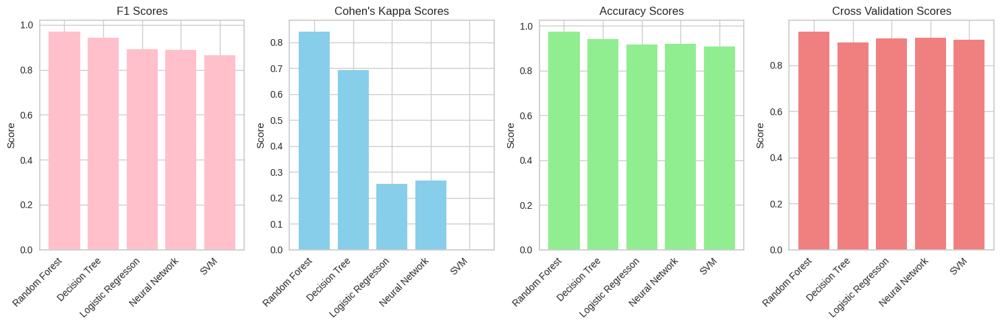

In [112]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].bar(sorted_models, sorted_f1s, color='pink')
axs[0].set_title("F1 Scores")
axs[0].set_ylabel("Score")
axs[0].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[1].bar(sorted_models, sorted_kappas, color='skyblue')
axs[1].set_title("Cohen's Kappa Scores")
axs[1].set_ylabel("Score")
axs[1].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[2].bar(sorted_models, sorted_accuracies, color='lightgreen')
axs[2].set_title("Accuracy Scores")
axs[2].set_ylabel("Score")
axs[2].set_xticklabels(sorted_models, rotation=45, ha='right')

axs[3].bar(sorted_models, sorted_scores, color='lightcoral')
axs[3].set_title("Cross Validation Scores")
axs[3].set_ylabel("Score")
axs[3].set_xticklabels(sorted_models, rotation=45, ha='right')

plt.tight_layout()
plt.show()

This figure shows the comparison of five different machine learning models across four different evaluation metrics:

***Models Compared***
1. **Random Forest**
2. **Decision Tree**
3. **Logistic Regression**
4. **Neural Network**
5. **Support Vector Machine (SVM)**

***Metrics Compared***
1. **F1 Scores**: (First Plot)
   - The F1 score is a harmonic mean of precision and recall, often used for imbalanced datasets.
   - **Random Forest** has the highest F1 score, followed closely by Decision Tree and Logistic Regression.
   - **SVM** has the lowest F1 score compared to the other models.

2. **Cohen's Kappa Scores**: (Second Plot)
   - Cohen's Kappa measures the agreement between predicted and actual classifications, adjusting for chance.
   - **Random Forest** shows the highest agreement (Kappa score close to 0.8), followed by Decision Tree.
   - **Neural Network** and **SVM** perform the worst in terms of Cohen's Kappa, indicating lower agreement between predicted and actual classifications.

3. **Accuracy Scores**: (Third Plot)
   - Accuracy measures the proportion of correct predictions out of total predictions.
   - All models have high accuracy scores, with **Random Forest** slightly outperforming the others.
   - **SVM**, **Neural Network**, and **Logistic Regression** are close in terms of accuracy but slightly behind Random Forest and Decision Tree.

4. **Cross-Validation Scores**: (Fourth Plot)
   - Cross-validation scores (likely mean accuracy or F1 score across multiple folds) measure model performance over multiple data splits.
   - **Random Forest** consistently has the best cross-validation score, followed closely by **Logistic Regression**, **Neural Network**, and **Decision Tree**.
   - **SVM** shows the lowest cross-validation score, similar to its F1 score.

***Overall Insights***
- **Random Forest** consistently outperforms other models across all metrics, with the highest F1 score, Cohen’s Kappa, accuracy, and cross-validation score.
- **Decision Tree** performs well across all metrics, just slightly behind Random Forest.
- **Logistic Regression** and **Neural Network** have similar performance, although Neural Network shows a drop in Cohen’s Kappa score, indicating some issues in model reliability.
- **SVM** consistently shows the lowest scores across all metrics, indicating it may not be well-suited for this particular dataset.

Let me know if you'd like further clarification on any specific part!

# Hyperparameter Tuning

## Installing Optuna

In [94]:
! pip install optuna

In [95]:
! pip install --upgrade optuna optuna-integration

In [96]:
import optuna

## Defining Objective Function

In [97]:
def objective(trial):
    classifier_name = trial.suggest_categorical("classifier", ["Random Forest", "Decision Tree", "Logistic Regression"])

    if classifier_name == "Random Forest":
        random_forest = RandomForestClassifier(n_estimators = trial.suggest_int("n_estimators", 50, 300, 20),
                                               max_depth = trial.suggest_int("max_depth", 2, 20, log=True),
                                               min_samples_split = trial.suggest_int("min_samples_split", 2, 10),
                                               min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10))

        random_forest.fit(X_train, y_train)

        y_pred = random_forest.predict(X_val)
        score = f1_score(y_val, y_pred, average='weighted')


    elif classifier_name == "Decision Tree":
        decision_tree = DecisionTreeClassifier(max_depth = trial.suggest_int("max_depth", 2, 20, log=True),
                                               min_samples_split = trial.suggest_int("min_samples_split", 2, 10),
                                               min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10))

        decision_tree.fit(X_train, y_train)

        y_pred = decision_tree.predict(X_val)
        score = f1_score(y_val, y_pred, average='weighted')


    else:  # LogisticRegression
        logistic_regression = LogisticRegression(C = trial.suggest_float("C", 1e-6, 1e2, log=True),
                                                 solver = trial.suggest_categorical("solver", ["liblinear", "saga"]),
                                                 max_iter = 1000)

        logistic_regression.fit(X_train, y_train)

        y_pred = logistic_regression.predict(X_val)
        score = f1_score(y_val, y_pred, average='weighted')


    return score

## Optimizing the Hyperparameters

In [98]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=15)

[I 2024-09-08 17:22:32,146] A new study created in memory with name: no-name-2d9497aa-75f6-4d45-9344-126d2e0d2afc
[I 2024-09-08 17:22:38,812] Trial 0 finished with value: 0.9165927449768423 and parameters: {'classifier': 'Decision Tree', 'max_depth': 16, 'min_samples_split': 3, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.9165927449768423.
[I 2024-09-08 17:22:41,983] Trial 1 finished with value: 0.8645728778531374 and parameters: {'classifier': 'Random Forest', 'n_estimators': 50, 'max_depth': 3, 'min_samples_split': 4, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.9165927449768423.
[I 2024-09-08 17:22:42,695] Trial 2 finished with value: 0.8905875959736796 and parameters: {'classifier': 'Decision Tree', 'max_depth': 2, 'min_samples_split': 8, 'min_samples_leaf': 10}. Best is trial 0 with value: 0.9165927449768423.
[I 2024-09-08 17:23:06,191] Trial 3 finished with value: 0.9002456746757678 and parameters: {'classifier': 'Random Forest', 'n_estimators': 110, 'max_depth'

## Best Models with Best Hyperparameters

In [99]:
print("Best trial:")
best_trials = study.best_trial

print(f"Classifier: {best_trials.params['classifier']}")
print(f"Best hyperparameters: {best_trials.params}")
print(f"Best F1 score: {best_trials.value}")

Best trial:
Classifier: Decision Tree
Best hyperparameters: {'classifier': 'Decision Tree', 'max_depth': 20, 'min_samples_split': 10, 'min_samples_leaf': 10}
Best F1 score: 0.9189009165387765


## Fitting the Best Model

In [104]:
best_params = study.best_params
best_model_name = best_params.pop('classifier')

In [105]:
if best_model_name == 'Random Forest':
  best_model = RandomForestClassifier(**best_params, random_state=0)
elif best_model_name == 'Logistic Regression':
  best_model = LogisticRegression(**best_params, random_state=0)
else:
  best_model = DecisionTreeClassifier(**best_params, random_state=0)

In [106]:
best_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=20, min_samples_leaf=10, min_samples_split=10,
                       random_state=0)

## Testing the Best Model

In [107]:
y_pred_best = best_model.predict(test_X)

In [108]:
best_accuracy = accuracy_score(test_y, y_pred_best)
best_f1 = f1_score(test_y, y_pred_best, average='weighted')
best_kappa = cohen_kappa_score(test_y, y_pred_best)
best_report = classification_report(test_y, y_pred_best)

In [109]:
print("Metrics of the Best Model:")
print("-" * 60)
print("Accuracy:", best_accuracy)
print("F1 Score:", best_f1)
print("Cohen's Kappa Score:", best_kappa)

Metrics of the Best Model:
------------------------------------------------------------
Accuracy: 0.9286446951790572
F1 Score: 0.9174188289054297
Cohen's Kappa Score: 0.5032193853552878


In [110]:
print("Classification Report:\n", best_report)

Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.48      0.57      1305
           1       0.52      0.38      0.44       331
           2       0.75      0.41      0.53       121
           3       0.73      0.63      0.68        35
           4       0.78      0.69      0.73        26
           5       0.75      0.43      0.55         7
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         3
          32       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.94      0.98      0.96     20307
          37       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         5
          41       0.00      0.00      0.00         3
          42       0.00      0.00      0.00         4
          43       0.00      0.00      0.00         4
   

## Observation



*   Therefore the best model turns out to be as the ***Decision Tree Classifier***.
*   It is providing **`accuracy = 0.93`** and **`F1 Score (weighted) = 0.92`**.



## Saving the Model

In [112]:
import joblib

joblib.dump(best_model, 'spotify_best_model.pkl')

['spotify_best_model.pkl']

## Visualizing the Tree

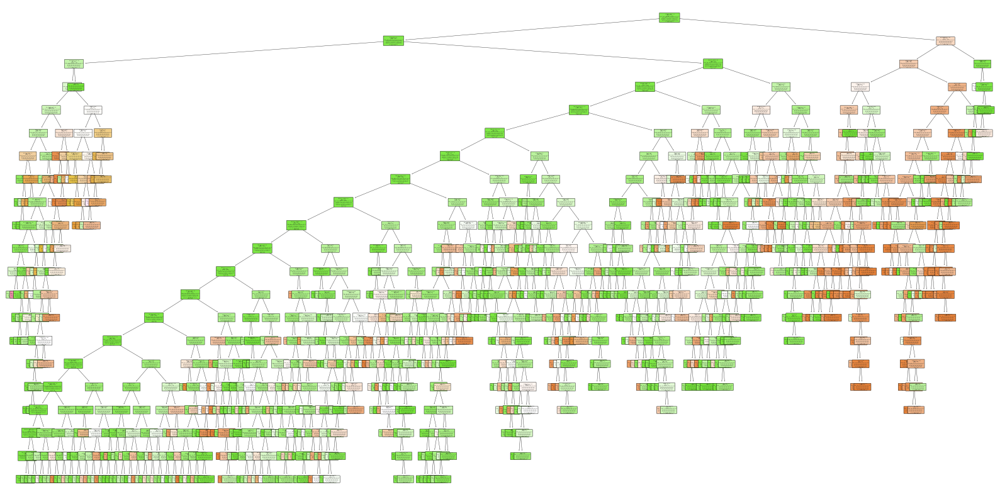

In [111]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20,10))
plot_tree(best_model, feature_names=X_train.columns, class_names=True, filled=True, rounded=True)
plt.show()

# Feature Importance

In [113]:
feature_importances = best_model.feature_importances_

In [118]:
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

In [119]:
print(feature_importance_df)

                       Feature  Importance
14             christmas_album    0.203193
0                  duration_ms    0.076738
2                       energy    0.071954
7                        tempo    0.062907
1                 danceability    0.060848
..                         ...         ...
71         track_genre_dubstep    0.000000
70             track_genre_dub    0.000000
69   track_genre_drum-and-bass    0.000000
68          track_genre_disney    0.000000
155    track_genre_world-music    0.000000

[156 rows x 2 columns]


## Top 20 Features

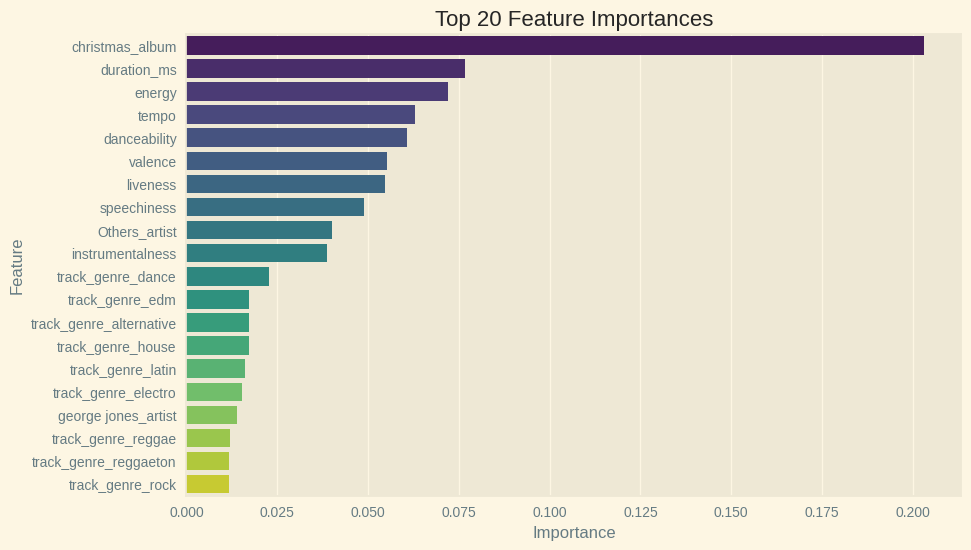

In [156]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20), palette='viridis')
plt.title('Top 20 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

This plot is a **Feature Importance** chart that shows the top 20 features ranked by their importance in a machine learning model. This is generated for **Decision Tree Classifier**, which provide a measure of how much each feature contributes to the model's predictions.

***Key Elements of the Plot***
1. **Y-axis (Feature Names)**:
   - This axis lists the top features in the dataset that are most important for the model. These features could be derived from various characteristics of the data, such as:
     - **christmas_album**: Indicates whether the song is from a Christmas album, which seems to be the most important feature.
     - **duration_ms**: Duration of the track in milliseconds.
     - **energy**, **tempo**, **danceability**, **valence**, **liveness**, **speechiness**, **instrumentalness**: These are audio features typically provided in music datasets (like Spotify), measuring different characteristics of the song.
     - **track_genre** and **Others_artist**: These might represent the genres of the track and a catch-all category for less frequent artists.

2. **X-axis (Feature Importance)**:
   - This axis represents the **importance score** for each feature, likely calculated by the model as the reduction in a loss function (e.g., Gini impurity, entropy) or through permutation importance.
   - A **higher value** indicates that the feature plays a larger role in determining the model's output.

***Interpretation***
- **christmas_album** stands out as the most important feature by far, indicating that whether a song is from a Christmas album significantly influences the model's predictions. This may suggest a strong bias or specific patterns associated with Christmas music in the dataset.
- **duration_ms** (the duration of the song) is also a critical feature, followed by features related to the song's **energy**, **tempo**, and **danceability**. These are likely audio characteristics used to predict some property or category related to the song.
- Features such as **speechiness**, **liveness**, and **valence** are also relatively important, though not as impactful as the top features.
- **Others_artist** and several **track_genre** categories contribute, but their impact is less significant compared to the top audio features.

***Summary***
- The plot ranks the features by their importance to the model, with **christmas_album** being the most influential.
- Features related to song duration, energy, and other audio characteristics are also quite important, while artist-related and genre features have a lower impact.
  
This analysis suggests that the model is likely using audio characteristics and specific metadata (like whether a song is from a Christmas album) to make predictions.

## Features with Importance More than 5%

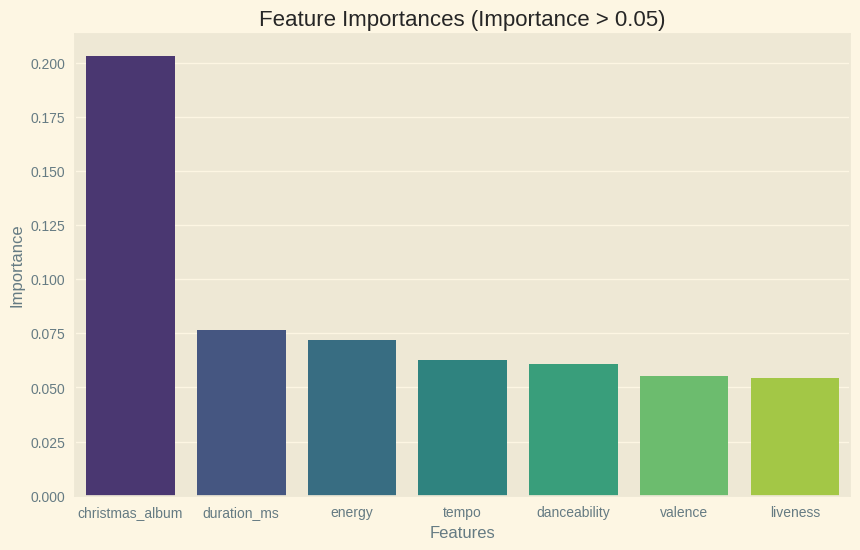

In [157]:
important_features = feature_importance_df[feature_importance_df['Importance'] > 0.05]

plt.figure(figsize=(10, 6))
sns.barplot(y='Importance', x='Feature', data=important_features, palette='viridis')
plt.title('Feature Importances (Importance > 0.05)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

This plot represents the **Feature Importances** for a machine learning model, but it shows only the features with an importance score greater than **0.05**. This allows you to focus on the most important features contributing to the model’s performance.

***Key Elements of the Plot***

1. **Y-axis (Importance)**:
   - Represents the importance score of each feature. Higher values indicate that the feature contributes more to the model’s predictions.
   - The importance is likely calculated based on metrics such as **Gini Importance** (in this case the Decision Tree Classifier) or **permutation importance**.

2. **X-axis (Features)**:
   - Lists the most important features used by the model. Only features with an importance score greater than **0.05** are shown.

***Features Displayed***
- **christmas_album**: This feature has by far the highest importance score (~0.2), meaning it plays a dominant role in the model’s decisions. This suggests that whether or not a track is from a Christmas album heavily influences the predictions.
- **duration_ms**: The duration of the track in milliseconds is the second most important feature, though its importance is much lower than that of `christmas_album`.
- **energy**, **tempo**, **danceability**, **valence**, and **liveness**: These are audio characteristics of the track, and while their importance scores are similar, they each have a moderate contribution to the model’s performance.

***Interpretation***
- **christmas_album** dominates the feature importance, suggesting that tracks from Christmas albums play a key role in predicting the target variable.
- **duration_ms** and various **audio features** like energy and tempo also contribute meaningfully to the model, but to a lesser extent.
- The plot only shows features with an importance score greater than **0.05**, which helps in identifying the most influential features for the model, filtering out less impactful ones.

***Insights***
- This type of plot is useful when analyzing which features have the most influence in your model's decision-making process, and it can help guide feature selection or engineering.
- **christmas_album** seems to be a crucial factor, but this could potentially indicate a bias in the data if Christmas tracks are overrepresented in the dataset.

## Business Implications

The **Top 20 Feature Importances** from a machine learning model has been used to predict Spotify track popularity. These feature importances highlight the audio and metadata characteristics that are most influential in determining a track's success. Here's how these insights can be applied to various business objectives:

1. **Optimizing Track Production and Development**:
   - **Insight**: Features such as `duration_ms`, `tempo`, and `speechiness` have the highest importance, meaning these are key factors that contribute to a track's popularity.
   - **Application**: **Artists and Producers** can focus on optimizing these attributes during the production process. For example:
     - **Track Duration**: Producers can experiment with track lengths that align with successful patterns (e.g., longer or shorter durations depending on genre preferences).
     - **Tempo**: By aligning the tempo with what listeners prefer, producers can create more engaging and potentially popular tracks, particularly for genres like EDM or pop that are more tempo-driven.
     - **Speechiness**: If speechiness (presence of spoken words) is a high-impact factor, artists may choose to emphasize or reduce spoken content depending on the target audience.

2. **Strategic Marketing and Promotion**:
   - **Insight**: Features like `instrumentalness`, `danceability`, and `loudness` are also significant contributors to popularity.
   - **Application**: **Marketing Teams** can tailor their promotional strategies based on the strengths of these features:
     - **Danceability and Loudness**: If a track scores high on danceability and loudness, it can be promoted in social and high-energy environments, such as clubs, festivals, or workout playlists.
     - **Instrumentalness**: Tracks with higher instrumentalness may be marketed towards specific niche audiences, such as classical music lovers or ambient music listeners, thereby improving the effectiveness of campaigns.
   - **Genre-Specific Promotion**: Features like `track_genre_jazz`, `track_genre_latin`, and `track_genre_reggaeton` suggest that genre plays an important role in popularity. Marketing strategies can be tailored to these genres to target relevant audiences on platforms like Spotify and social media.

3. **Enhanced Playlist Curation**:
   - **Insight**: With features like `liveness` and `valence` contributing to popularity, streaming platforms can enhance their recommendation and playlist curation algorithms.
   - **Application**: **Streaming Platforms** can leverage these insights to create playlists that resonate more with users:
     - **Happy/Upbeat Playlists**: Tracks with high valence (positiveness) can be included in playlists aimed at boosting mood or energy, such as "Feel-Good" or "Happy Hits" playlists.
     - **Live Performances**: Tracks with higher liveness scores can be featured in live music or concert-based playlists, catering to users who enjoy the ambiance of live performances.
   - **Targeted Recommendations**: Platforms can use these feature importance rankings to improve recommendation systems, providing users with tracks that match their listening preferences based on characteristics like tempo, danceability, and speechiness.

4. **Data-Driven Artist Development**:
   - **Insight**: Genre-related features (`track_genre_jazz`, `track_genre_rock`, `track_genre_dance`) indicate that genre significantly impacts popularity.
   - **Application**: **Record Labels and A&R Teams** can use this data to inform artist development and genre-specific investments:
     - **Genre Expansion**: Labels may encourage artists to explore popular genres like Latin, Reggaeton, or Jazz based on the data trends, potentially leading to new successful tracks.
     - **Track Characteristics**: A&R teams can use feature importance rankings to guide artists in developing songs that align with the characteristics driving popularity within their target genres, increasing the likelihood of success.

5. **Optimizing Advertising Revenue and User Engagement**:
   - **Insight**: Popularity-driving features help platforms understand which types of tracks keep users engaged.
   - **Application**: **Streaming Services** can use feature importance data to increase engagement and ad revenue:
     - **Engagement Maximization**: By prioritizing tracks with high scores in features like tempo, valence, and danceability, platforms can improve user engagement metrics, leading to longer listening sessions and increased ad impressions.
     - **Premium Subscription Push**: Platforms can highlight tracks that fit user preferences, encouraging them to subscribe to premium services for an ad-free experience.

6. **Customized Event Promotion**:
   - **Insight**: Features like `track_genre_latin` and `track_genre_reggaeton` point to popularity in specific cultural or social contexts.
   - **Application**: **Event Organizers and Sponsors** can align their music choices with the top-ranked features to create more engaging live events:
     - **Cultural Festivals**: Events targeting Latin, Jazz, or Reggaeton music fans can be curated based on feature importance, ensuring the right music mix for the audience, thereby increasing attendance and sponsorship opportunities.
     - **Partnerships**: Brands can partner with specific genres based on popularity trends, helping them reach target demographics more effectively through events and promotional collaborations.

7. **For the Whole Music Industry: Future-Proofing Trends and Investment Decisions**:
   - **Insight**: The analysis of feature importance can help the music industry stay ahead of emerging trends and ensure that investments are strategically aligned with the future of music.
   - **Application**:
     - **Future-Proofing Trends**: By monitoring the features that drive track popularity, industry stakeholders can detect emerging trends early. For example, a sudden increase in the importance of certain genres (like Latin or Jazz) or characteristics (like acousticness or liveness) can signal a shift in listener preferences. The music industry can leverage this information to invest in developing talent or producing music that aligns with these future trends.
     - **Investment Decisions**: Record labels, streaming platforms, and investors can use these insights to allocate resources more efficiently. By investing in artists, tracks, or genres that align with high-importance features, stakeholders can maximize their returns. For instance, if `track_genre_reggaeton` or `track_genre_dance` shows increasing importance, record labels can sign more artists in these genres, while streaming platforms can allocate more promotional resources to these tracks. This helps ensure that investments are data-driven and focused on music with the highest potential for commercial success.


By understanding the relative importance of various features, businesses in the music industry can make more informed, data-driven decisions that maximize the commercial success of tracks. Whether it's optimizing track production, enhancing marketing campaigns, curating playlists, or improving user engagement, these insights enable stakeholders to refine their strategies based on the characteristics that matter most to listeners.

On a broader scale, the entire music industry can benefit from these insights by staying ahead of emerging trends and making smarter investment decisions. By continuously analyzing feature importance, the industry can future-proof its strategies, ensuring that resources are directed toward the most promising genres, artists, and musical trends. This proactive approach allows the industry to stay competitive, innovative, and aligned with evolving consumer preferences.

# Model Interpretation with LIME

In [131]:
spotify['average_popularity'] = spotify['average_popularity'].astype('category')

In [132]:
X = spotify.drop('average_popularity', axis=1)
y = spotify['average_popularity']

In [133]:
X = X.applymap(lambda x: int(x) if isinstance(x, bool) else x)

In [134]:
X.shape, y.shape

((112114, 28), (112114,))

In [135]:
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
categorical_cols

Index(['key', 'mode', 'time_signature', 'track_genre'], dtype='object')

In [136]:
X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

In [137]:
X_encoded.shape

(112114, 151)

In [138]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=0)

In [139]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Installing LIME

In [140]:
! pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=59a616bf5516705e1e3899cd6fe36e7707baf0b9ddcfd95ccdb84c05b3643ac5
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [141]:
import lime
import lime.lime_tabular

## Fitting the Best Model

In [142]:
best_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=20, min_samples_leaf=10, min_samples_split=10,
                       random_state=0)

## Model Explanation

In [143]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
classes_ = le.fit_transform(spotify['average_popularity'])

In [145]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X_train.columns.tolist(),
    class_names=classes_.tolist(),
    mode='classification')

In [146]:
explanation = explainer.explain_instance(
    data_row = X_test.iloc[10],
    predict_fn = best_model.predict_proba,
    num_features = 7)

### Tabular Format

In [147]:
explanation.show_in_notebook(show_table=True, show_all=False)

### LIME Plot

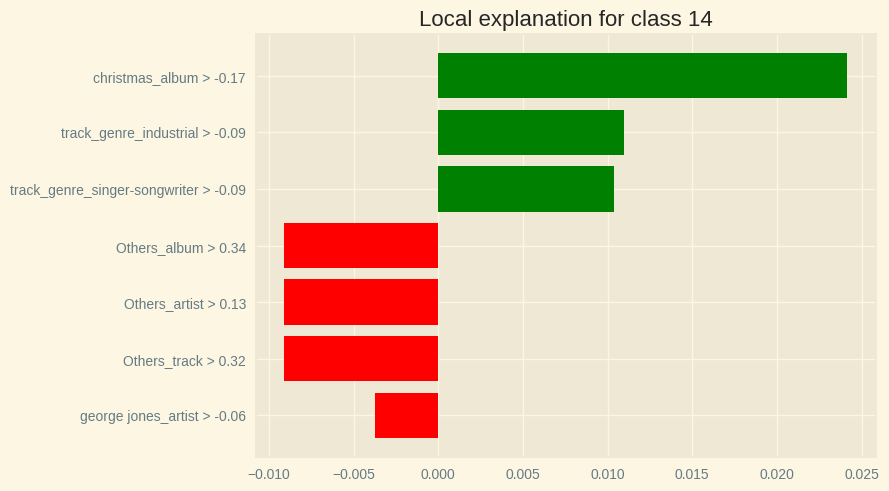

In [150]:
plt.style.use('Solarize_Light2')
fig = explanation.as_pyplot_figure()
plt.show()

This plot appears to be a **local explanation** for a specific instance (or sample) in a machine learning classification task, specifically for **class 14**. It is likely generated using a method like **LIME** (Local Interpretable Model-agnostic Explanations), which explain how the model made its prediction for this particular class.

***Key Elements***

1. **X-axis (Impact on Prediction)**:
   - The X-axis represents the contribution of each feature to the prediction for **class 14**.
   - Positive values (towards the right) indicate features that **push the prediction towards class 14**.
   - Negative values (towards the left) indicate features that **push the prediction away from class 14**.

2. **Y-axis (Features and Feature Values)**:
   - The Y-axis lists the individual features along with their threshold values (e.g., `album > -0.17`, `industrial > -0.09`).
   - Each feature shown here has either a positive (green) or negative (red) impact on the prediction for class 14.

3. **Positive Contributions (Green Bars)**:
   - Features with **green bars** are pushing the model towards predicting **class 14**. These are features that contribute positively to the probability of the sample being classified as class 14.
   - In this case:
     - `album > -0.17` has the strongest positive contribution.
     - Other features like `industrial > -0.09` and `songwriter > -0.09` also contribute to the prediction for class 14, but to a lesser extent.

4. **Negative Contributions (Red Bars)**:
   - Features with **red bars** are pushing the model **away from class 14**. These are features that reduce the probability of the sample being classified as class 14.
   - In this case:
     - `xmas_album > 0.34` has the strongest negative contribution.
     - Other features such as `others_artist > 0.13` and `others_track > 0.32` also contribute negatively, making the model less likely to predict class 14.

***Interpretation***
- The plot provides a **local explanation** of why the model predicted class 14 for this particular sample. Features such as `album > -0.17` and `industrial > -0.09` have a positive influence, pushing the prediction towards class 14, while features like `xmas_album > 0.34` and `others_artist > 0.13` push the prediction away from class 14.
- **Green bars** indicate positive contributions to the prediction of class 14, while **red bars** indicate negative contributions.

***Summary***
- This plot explains which features most influenced the prediction for a particular sample to be classified as **class 14**.
- Features that increase the likelihood of predicting class 14 are shown in **green**, and those that decrease the likelihood are shown in **red**.
- The feature `album > -0.17` has the largest positive effect, while `xmas_album > 0.34` has the largest negative effect.

# Conclusion & Results

The plots provided above, particularly the feature importance plots and the LIME local explanation, offer valuable insights that can be leveraged in a business context, especially in the music and entertainment industry. Here are some potential conclusions and actionable insights derived from these plots:

***1. Understanding Key Features Driving Popularity or Classification:***

- **Duration and Instrumentalness**: The feature importance plots indicate that track duration (`num__duration_ms`) and whether a track is instrumental (`num__instrumentalness`) are among the most critical features. In a business context, this suggests that listeners' engagement or track success might be highly influenced by these factors.
- **Actionable Insight**: Artists and producers might consider optimizing track lengths and experimenting with instrumental versions to meet listener preferences.

- **Tempo and Speechiness**: The prominence of `num__tempo` and `num__speechiness` implies that the pace of a track and the amount of spoken content (e.g., rap or spoken word) are also important.
- **Actionable Insight**: Marketing campaigns or playlist placements could be tailored to highlight tracks with certain tempos or speech characteristics to cater to specific audience preferences or moods.

***2. Genre and Artist Impact on Popularity:***

- **Genre-Specific Preferences**: Features like `track_genre_jazz`, `track_genre_latin`, `track_genre_dance`, and others indicate that genre plays a significant role in predicting popularity or classification. This suggests that listeners have strong preferences for certain genres, and these preferences influence the success of tracks in those genres.
- **Actionable Insight**: Curators should create genre-specific playlists, and marketing efforts should be tailored to highlight genre-related characteristics. Understanding genre trends can help in predicting future hits and managing catalog priorities.

- **Artist-Specific Features**: The presence of features like `artist_Stevie Wonder` and `artist_Others` indicates that the identity of the artist significantly impacts track success.
- **Actionable Insight**: Leveraging well-known artists or strategically partnering with popular or emerging artists can enhance a track's chances of success. Additionally, tracks associated with well-recognized artists could be prioritized for promotional activities.

***3. Strategic Album and Track Releases:***

- **Album-Related Features**: The negative impact of features like `Vol_album` on specific class predictions suggests that certain album-related characteristics might not always align with the factors driving popularity or classification into a preferred category.
- **Actionable Insight**: The strategy for album releases should consider the composition of tracks (balancing popular track features) and the marketing message. Creating thematic coherence that aligns with what is known to drive popularity can be a more effective strategy.

***4. Personalization and Targeting:***

- **Tailoring Recommendations**: The insights from LIME plots can be used to tailor recommendations more accurately. If certain features (e.g., track duration, genre) are identified as driving factors for specific user segments, these can be used to personalize music recommendations.
- **Actionable Insight**: Use these insights to improve algorithmic recommendations, ensuring that users are exposed to tracks that are more likely to align with their preferences based on the identified key features.

***5. Improving User Experience and Engagement:***

- **Playlist Curation**: Understanding which features contribute most to track popularity can help in curating playlists that maximize user engagement.
- **Actionable Insight**: Curate playlists based on the top features that resonate with the majority of users, such as specific tempos, instrumental tracks, or popular genres. Seasonal or event-based playlists can be designed around these insights (e.g., instrumental or jazz playlists for relaxation).

- **New Product Development**: Insights from these plots can guide the creation of new music products or services. For instance, a platform could develop a feature that allows users to explore tracks with specific characteristics (e.g., by tempo, instrumentalness) more interactively. **Actionable Insight**: Launch features that enable users to filter and explore music based on key characteristics identified in the analysis.

***6. Insights into Local Explanations for Class Predictions:***

- **Localized Marketing Strategies**: The LIME plot indicates how specific features influence predictions for individual classes. For instance, the importance of genres and artist presence might vary across different user segments.

- **Actionable Insight**: Use these localized insights to tailor marketing and promotional strategies to cater to diverse audience segments. Understanding which features push tracks towards specific classes can inform decisions on how to position or promote these tracks.


These insights derived from the plots can guide decision-making in various areas, such as marketing, product development, playlist curation, and artist partnerships. By understanding what drives track popularity or classification, businesses can better align their strategies with user preferences, ultimately enhancing user engagement, satisfaction, and revenue generation.

If you need further analysis or have specific questions regarding these insights, please let me know!